<a href="https://colab.research.google.com/github/chrisb347/Finance-and-Machine-Learning/blob/master/Project_1_Barry%26Yihao_Copy1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project 1 - CISC6352 Advanced Computational Finance Summer 2020

**by Yihao & Chris**

### Import and Others

In [ ]:
!pip install kneed
!pip install polygon-api-client
# !apt install imagemagick

     |████████████████████████████████| 204kB 12.2MB/s 
     |████████████████████████████████| 81kB 5.8MB/s 
     |████████████████████████████████| 61kB 7.1MB/s 
     |████████████████████████████████| 61kB 7.0MB/s 
ERROR: google-colab 1.0.0 has requirement requests~=2.23.0, but you'll have requests 2.22.0 which is incompatible.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
  Found existing installation: idna 2.9
    Uninstalling idna-2.9:
      Successfully uninstalled idna-2.9
  Found existing installation: requests 2.23.0
    Uninstalling requests-2.23.0:
      Successfully uninstalled requests-2.23.0


In [ ]:
from google.colab import drive
import os
import glob

import numpy as np
import pandas as pd

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA, SparsePCA
from sklearn.manifold import LocallyLinearEmbedding as LLE, TSNE
# from sklearn.manifold import LocallyLinearEmbedding as LLE
from umap import UMAP
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn import metrics
from sklearn.neighbors import NearestNeighbors

from kneed import KneeLocator

import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
from matplotlib import cm
import matplotlib.animation as animation
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import HTML
from matplotlib.colors import rgb2hex
import matplotlib.dates as mdates
import matplotlib.ticker as ticker
import seaborn as sns
# import plotly.express as px

import warnings
import pickle
from time import time
import collections
import json

# polygon.io API
from polygon import WebSocketClient, STOCKS_CLUSTER
from polygon import RESTClient

from datetime import datetime

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
warnings.filterwarnings('ignore')
pd.set_option('display.width',100,'display.max_columns',500)
%matplotlib inline

# Question 1

## 1. Use the variance concentration ratio to classify observations in the datasets provided and 3 other datasets you collect

In [ ]:
##import all the files

path = r'/content/drive/Shared drives/ACF Project/data' # use your path
all_files = glob.glob(path + "/*.csv")

li = []

for filename in all_files:
    df = pd.read_csv(filename, index_col=None, header=0,na_filter=False)
    li.append(df)

In [ ]:
names = [os.path.basename(x) for x in glob.glob(path + "/*.csv")]
list_names = [i.split(".")[0] for i in names]
print(list_names)

data_names = dict()

for j in range(len(li)):
    data_names[list_names[j]]=pd.DataFrame(li[j])

data_names

['MSFT', 'Option_Data_2000', 'HFT_AAPL_data', 'OptionDataOTM_data', 'music_data', 'GOOG2018-02-05_05-23', 'GOOG2019-03-01-05-16', 'FB2019-03-01-05-16', 'REGI', 'EMN', 'NRG']


{'EMN':             Date       Open       High  ...      Close  Adj Close   Volume
 0     2015-06-15  77.080002  77.690002  ...  77.660004  67.049347   999800
 1     2015-06-16  77.610001  78.400002  ...  78.330002  67.627769   712100
 2     2015-06-17  78.519997  79.000000  ...  78.949997  68.163063  1051500
 3     2015-06-18  79.089996  80.589996  ...  80.370003  69.389069  1730300
 4     2015-06-19  80.510002  81.250000  ...  80.480003  69.484039  2578500
 ...          ...        ...        ...  ...        ...        ...      ...
 1254  2020-06-08  77.389999  77.980003  ...  77.339996  76.572754  1174000
 1255  2020-06-09  75.379997  77.500000  ...  77.019997  76.255928  1487800
 1256  2020-06-10  77.120003  77.449997  ...  75.639999  74.889626  1537900
 1257  2020-06-11  72.000000  72.830002  ...  66.529999  65.869995  1976900
 1258  2020-06-12  68.879997  70.110001  ...  69.629997  69.629997  1199300
 
 [1259 rows x 7 columns],
 'FB2019-03-01-05-16':        average          change

In [ ]:

data_names1 = data_names.copy()
for i in data_names1:
  data_names1[i]=data_names1[i].select_dtypes(include=['number'])

data_names1



{'EMN':            Open       High        Low      Close  Adj Close   Volume
 0     77.080002  77.690002  76.290001  77.660004  67.049347   999800
 1     77.610001  78.400002  77.260002  78.330002  67.627769   712100
 2     78.519997  79.000000  78.089996  78.949997  68.163063  1051500
 3     79.089996  80.589996  79.000000  80.370003  69.389069  1730300
 4     80.510002  81.250000  80.230003  80.480003  69.484039  2578500
 ...         ...        ...        ...        ...        ...      ...
 1254  77.389999  77.980003  76.360001  77.339996  76.572754  1174000
 1255  75.379997  77.500000  74.639999  77.019997  76.255928  1487800
 1256  77.120003  77.449997  75.260002  75.639999  74.889626  1537900
 1257  72.000000  72.830002  66.500000  66.529999  65.869995  1976900
 1258  68.879997  70.110001  67.750000  69.629997  69.629997  1199300
 
 [1259 rows x 6 columns],
 'FB2019-03-01-05-16':        marketAverage  marketChangeOverTime  ...  numberOfTrades  volume
 0            185.298         

In [ ]:
def doPCA_std (data):
  scalar = StandardScaler()
  normalized_data=scalar.fit_transform(data)
  pca=PCA()
  newPCAData=pca.fit_transform(normalized_data)
  return(newPCAData,pca)

In [ ]:
def doPCA (data):
  pca=PCA()
  newPCAData=pca.fit_transform(data)
  return(newPCAData,pca)

In [ ]:
def doPCA_minMax (data):
  minMax_data=MinMaxScaler().fit_transform(data)
  minMax_data_df=pd.DataFrame(data=minMax_data, index=data.index,
                            columns=data.columns)
  pca=PCA()
  newPCAData=pca.fit_transform(minMax_data_df)
  return(newPCAData,pca)

## 2. Compare the variance concentration ratios of the data under MinMax,  StandardScaler normalizations and their raw data

### Raw PCA

In [ ]:
newData=dict()
raw_pca=dict()


for i in data_names1:
  newData[i],raw_pca[i]=doPCA(data_names1[i])



In [ ]:
for i in raw_pca:
  per_var = raw_pca[i].explained_variance_ratio_ * 100
  labels = ['PC' + str(x) for x in range(1, len(per_var) + 1)]
  fig=plt.figure(figsize=(15,7))
  plt.bar(x=range(1, len(per_var) + 1), height=per_var, tick_label=labels)
  plt.ylabel('percentange of explained variance')
  plt.xlabel('principal component')
  plt.title(i+" "+'Raw Explained Varinace Ratios')
plt.show()

### Standard Scaler PCA

In [ ]:
newData=dict()
std_pca=dict()


for i in data_names1:
  newData[i],std_pca[i]=doPCA_std(data_names1[i])

In [ ]:
for i in std_pca:
  per_var = std_pca[i].explained_variance_ratio_ * 100
  labels = ['PC' + str(x) for x in range(1, len(per_var) + 1)]
  fig=plt.figure(figsize=(15,7))
  plt.bar(x=range(1, len(per_var) + 1), height=per_var, tick_label=labels)
  plt.ylabel('percentange of explained variance')
  plt.xlabel('principal component')
  plt.title(i+" "+'Raw Explained Varinace Ratios')
plt.show()

### MIN MAX PCA

In [ ]:
newData=dict()
minMax_pca=dict()


for i in data_names1:
  newData[i],minMax_pca[i]=doPCA_minMax(data_names1[i])

In [ ]:
for i in minMax_pca:
  per_var = minMax_pca[i].explained_variance_ratio_ * 100
  labels = ['PC' + str(x) for x in range(1, len(per_var) + 1)]
  fig=plt.figure(figsize=(15,7))
  plt.bar(x=range(1, len(per_var) + 1), height=per_var, tick_label=labels)
  plt.ylabel('percentange of explained variance')
  plt.xlabel('principal component')
  plt.title(i+" "+'Raw Explained Varinace Ratios')
plt.show()

### Put them into the same plot

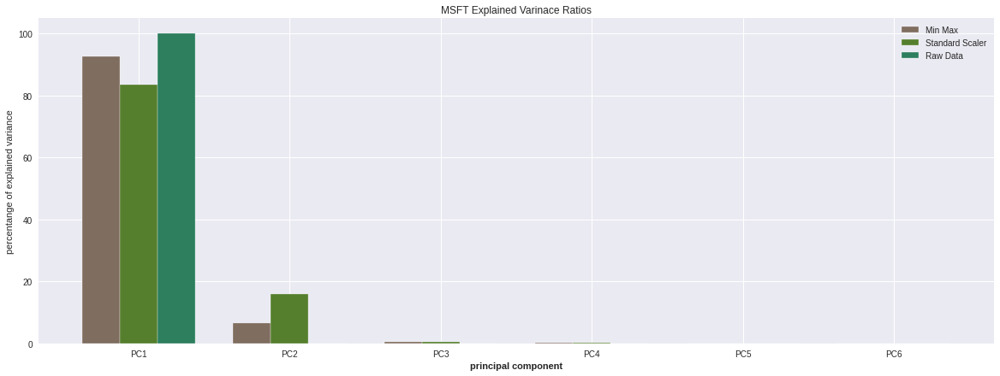

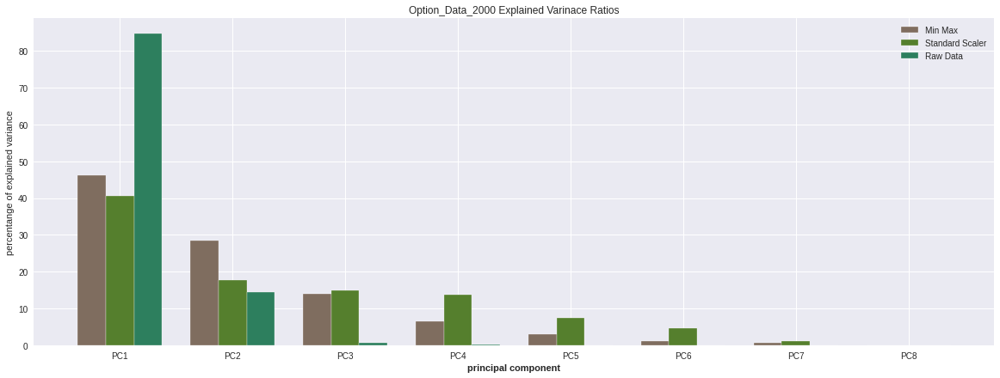

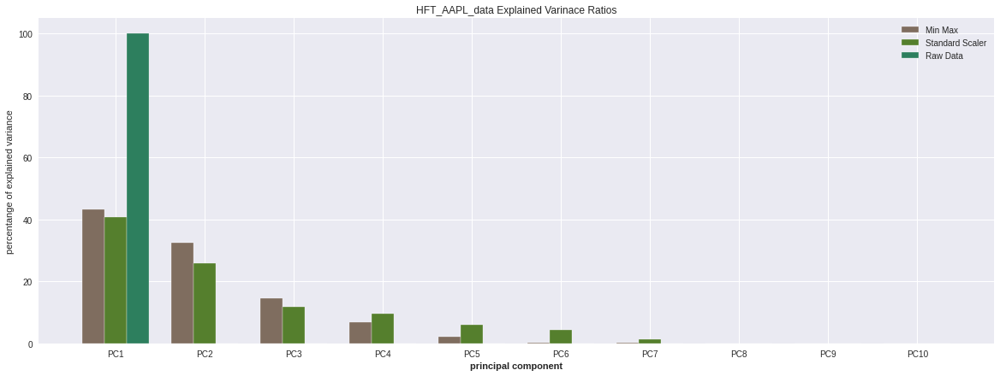

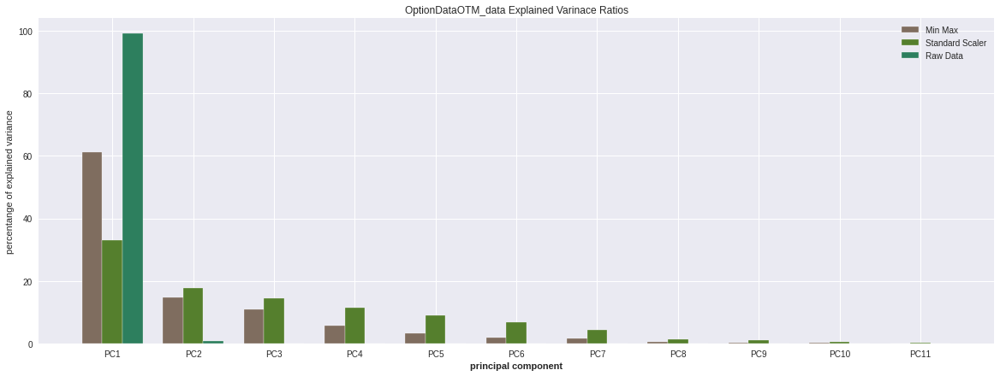

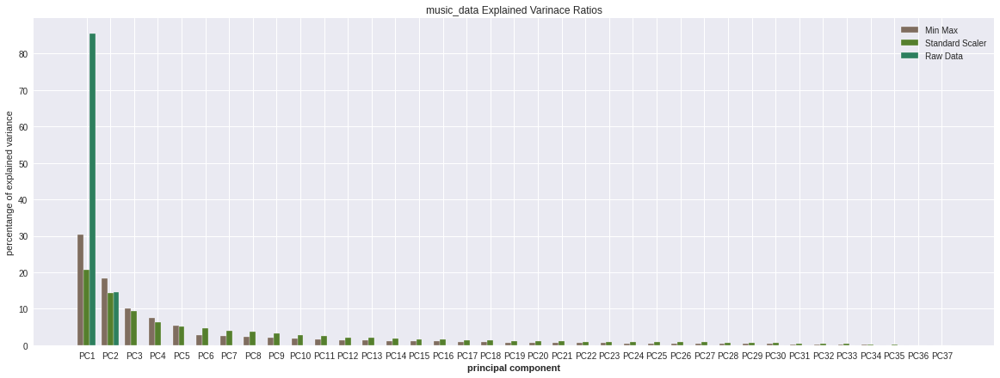

...

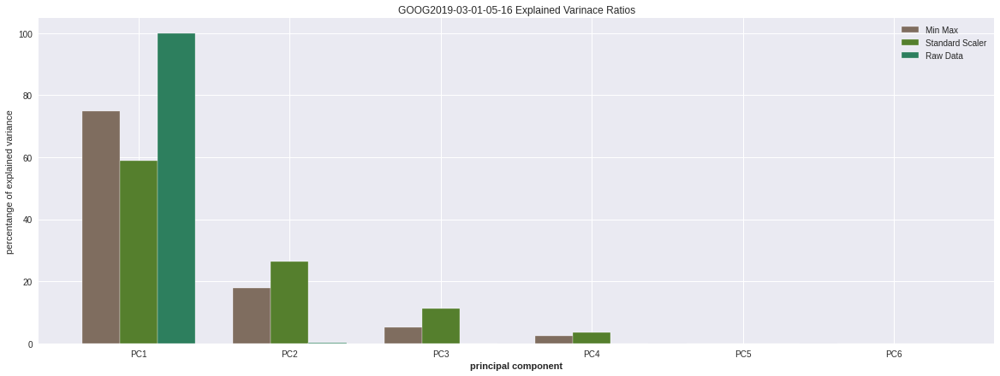

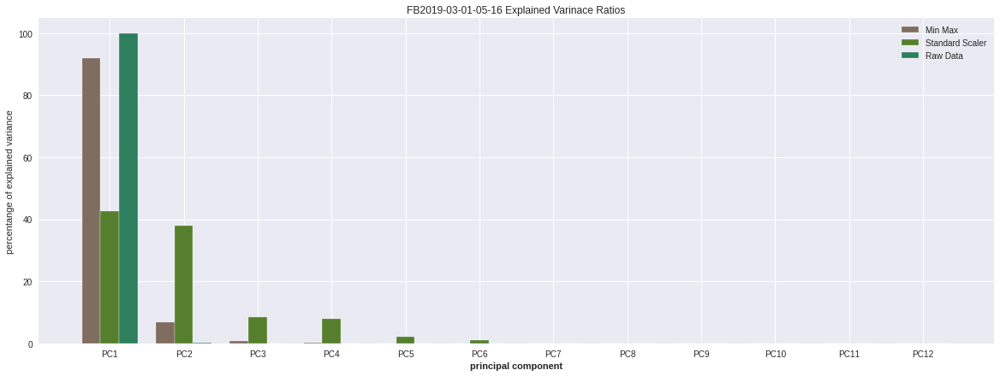

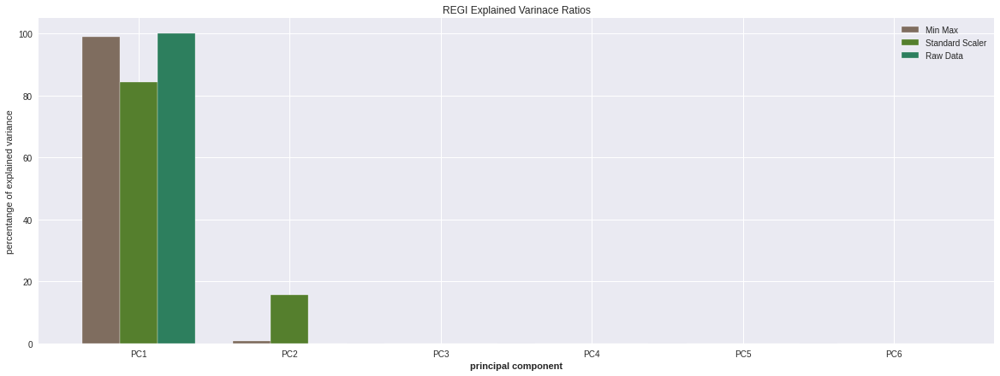

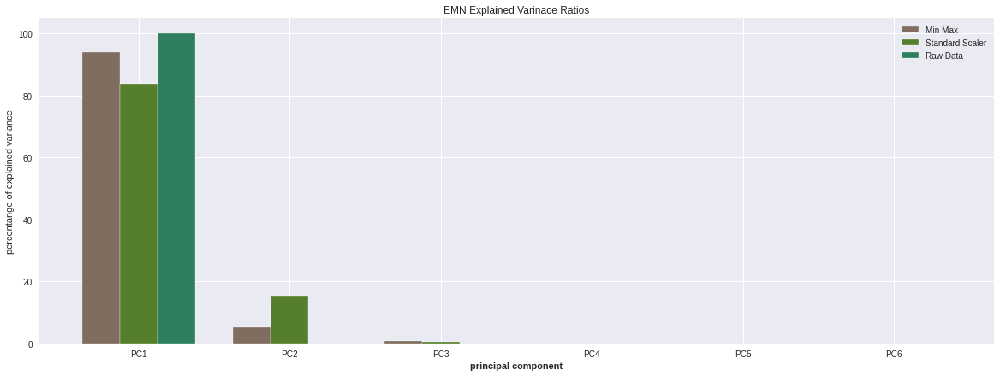

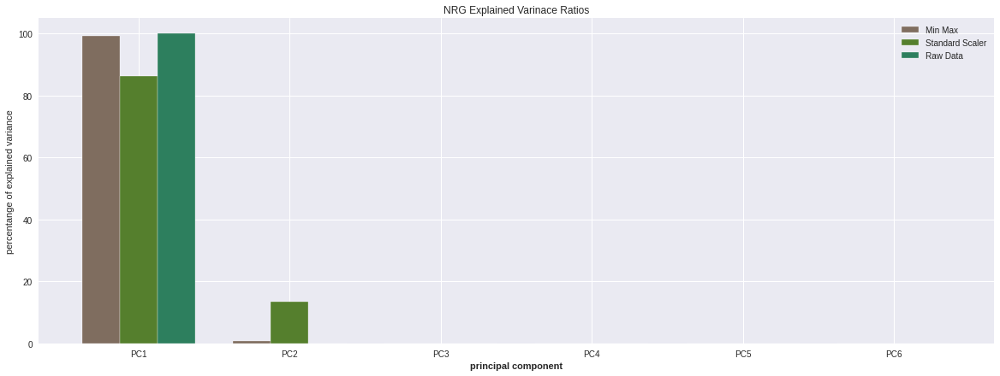

In [ ]:
for i in minMax_pca:
# set width of bar
  barWidth = 0.25
 
# set height of bar
  bars1 = minMax_pca[i].explained_variance_ratio_ * 100
  bars2 = std_pca[i].explained_variance_ratio_ * 100
  bars3 = raw_pca[i].explained_variance_ratio_ * 100
 
# Set position of bar on X axis
  r1 = np.arange(len(bars1))
  r2 = [x + barWidth for x in r1]
  r3 = [x + barWidth for x in r2]
 
# Make the plot
  fig=plt.figure(figsize=(20,7))
  plt.bar(r1, bars1, color='#7f6d5f', width=barWidth, edgecolor='white', label='Min Max')
  plt.bar(r2, bars2, color='#557f2d', width=barWidth, edgecolor='white', label='Standard Scaler')
  plt.bar(r3, bars3, color='#2d7f5e', width=barWidth, edgecolor='white', label='Raw Data')
 
# Add xticks on the middle of the group bars
  plt.xlabel('group', fontweight='bold')
  plt.xticks([r + barWidth for r in range(len(bars1))], ['PC' + str(q) for q in range(1, len(bars1) + 1)])
  plt.title(i+" "+'Explained Varinace Ratios')
  plt.ylabel('percentange of explained variance')
  plt.xlabel('principal component')
# Create legend & Show graphic
  plt.legend()

  plt.show()


# Question 2


## 2.0 Load and Pre-Process Data

In [ ]:
read_path = '/content/drive/Shared drives/ACF Project/Project_1/data'
os.chdir(read_path)
!ls

 Average.png		    HFT_AAPL_data.csv   NRG.csv
 Close.png		   'HFT Json'	        Option_Data_2000.csv
 EMN.csv		    High.png	        OptionDataOTM_data.csv
 FB2019-03-01-05-16.csv     Low.png	       'Question 3 data'
 GOOG2018-02-05_05-23.csv   MSFT.csv	        REGI.csv
 GOOG2019-03-01-05-16.csv   music_data.csv


In [ ]:
# file_names = []
file_name = 'HFT_AAPL_data.csv'
hft_aapl = pd.read_csv(file_name, index_col=0)

In [ ]:
hft_aapl

,Date,marketAverage,marketChangeOverTime,marketClose,marketHigh,marketLow,marketNotional,marketNumberOfTrades,marketOpen,marketVolume
0,2/1/2019 9:30,167.058,0.000000,167.150,167.55,166.67,1.319461e+08,1766,166.930,789821
1,2/1/2019 9:31,167.182,0.000742,167.175,167.42,166.80,2.853055e+07,1143,167.210,170656
2,2/1/2019 9:32,167.051,-0.000042,166.910,167.20,166.88,2.232776e+07,1016,167.170,133658
3,2/1/2019 9:33,166.945,-0.000676,166.958,167.11,166.77,2.014459e+07,839,166.970,120666
4,2/1/2019 9:34,167.045,-0.000078,167.180,167.19,166.92,1.707804e+07,843,166.960,102236
...,...,...,...,...,...,...,...,...,...,...
5845,2/22/2019 15:55,172.607,0.006220,172.595,172.74,172.45,5.664651e+07,2366,172.450,328182
5846,2/22/2019 15:56,172.631,0.006360,172.680,172.70,172.58,2.646660e+07,1133,172.595,153313
5847,2/22/2019 15:57,172.690,0.006704,172.670,172.73,172.67,1.727887e+07,690,172.690,100057
5848,2/22/2019 15:58,172.677,0.006628,172.720,172.74,172.64,2.521759e+07,1123,172.680,146039


In [ ]:
hft_aapl.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5850 entries, 0 to 5849
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Date                  5850 non-null   object 
 1   marketAverage         5850 non-null   float64
 2   marketChangeOverTime  5850 non-null   float64
 3   marketClose           5850 non-null   float64
 4   marketHigh            5850 non-null   float64
 5   marketLow             5850 non-null   float64
 6   marketNotional        5850 non-null   float64
 7   marketNumberOfTrades  5850 non-null   int64  
 8   marketOpen            5850 non-null   float64
 9   marketVolume          5850 non-null   int64  
dtypes: float64(7), int64(2), object(1)
memory usage: 502.7+ KB


In [ ]:
hft_aapl['Change'] = hft_aapl['marketClose'] - hft_aapl['marketOpen']
hft_aapl['Change'] = hft_aapl['Change'].apply(lambda x: 'Rise' if x>0 else ('Fall' if x<0 else 'Flat'))
time_ = hft_aapl['Date']
time_ = pd.to_datetime(time_)    
change_ = hft_aapl['Change']
oc_label = [hft_aapl['Change'] == 'Rise', hft_aapl['Change'] == 'Flat', hft_aapl['Change'] == 'Fall']
oc_label_name = ['Close > Open', 'Close = Open', 'Close < Open']

In [ ]:
data = hft_aapl.iloc[:,1:-1].copy()

## 2.1 Functions

In [ ]:
# Get PCA Embedding
def do_PCA(data):
    normalized_data = StandardScaler().fit_transform(data)
    pca_ = PCA()
    pcaNewData = pca_.fit_transform(normalized_data)
    return pcaNewData

In [ ]:
def do_PCA_1(data):
    normalized_data = StandardScaler().fit_transform(data)
    pca_ = PCA()
    pcaNewData = pca_.fit_transform(normalized_data)
    return pcaNewData, pca_

In [ ]:
# Get SparsePCA Embedding
def do_SPCA(data, sparseness=0.8):
    normalized_data = StandardScaler().fit_transform(data)
    spca_ = SparsePCA(alpha=sparseness)
    spcaNewData = spca_.fit_transform(normalized_data)
    return spcaNewData

In [ ]:
# Get t-SNE Embedding
def do_TSNE(data, perplexity=50, init='pca'):
    normalized_data = StandardScaler().fit_transform(data)
    tsne_ = TSNE(perplexity=perplexity,
                 init=init)
    tsneNewData = tsne_.fit_transform(normalized_data)
    return tsneNewData

In [ ]:
# Get UMAP Embedding
def do_UMAP(data, n_neighbors=50, min_dist=0.05, metric='euclidean', init='random'):
    normalized_data = StandardScaler().fit_transform(data)
    umap_ = UMAP(n_neighbors = n_neighbors,
                      min_dist = min_dist,
                      metric = metric,
                      init = init)
    umapNewData = umap_.fit_transform(normalized_data)
    return umapNewData

In [ ]:
# Biplot
def biplot(embedding, label, label_name, Method, size=(10,7), outlier_label=None):
    cmap = plt.get_cmap("tab20")
    mk_list = ["o","p",">","X","P"]
    fig, ax = plt.subplots(figsize=size)
    plt.style.use('seaborn')
    for i in range(len(label)):
        ax.scatter(embedding[label[i],0], embedding[label[i],1], label=label_name[i],
                   marker=mk_list[i], color=cmap(2*i), edgecolor='w', alpha=0.6, s=30)
    if outlier_label is not None:
        ax.scatter(embedding[outlier_label,0], embedding[outlier_label,1], 
                   label='Outlier', marker='s', color='black', edgecolor='gold', alpha=0.4, s=20)
    ax.legend(prop={'size': 10})
    x_text = '$PC_{1}$' if Method == 'pca' else ('$SparsePC_{1}$' if Method == 'spca' else ('$'+Method+'_{1}'+'$'))
    y_text = '$PC_{2}$' if Method == 'pca' else ('$SparsePC_{2}$' if Method == 'spca' else ('$'+Method+'_{2}'+'$'))
    ax.set_xlabel(x_text, fontsize=14)
    ax.set_ylabel(y_text, fontsize=14)
    plt.show()
    return fig, ax

In [ ]:
# Biplot Mark Text
def biplot_mark_text(fig, ax, embedding, text_array, color='black', color_array=None):
    if not color_array:
        color_array = np.array([color]*len(embedding))
    for i in range(len(embedding)):
        ax.text(embedding.iloc[i,0], embedding.iloc[i,1], text[i],
                color=color_array[i], fontsize=10, alpha=0.9)

In [ ]:
# Elbow
# https://towardsdatascience.com/how-to-use-dbscan-effectively-ed212c02e62
# https://towardsdatascience.com/machine-learning-clustering-dbscan-determine-the-optimal-value-for-epsilon-eps-python-example-3100091cfbc
def elbow(data, n_neighbors, ylim=(0,3)):
    normalized_data = StandardScaler().fit_transform(data)
    nearest_neighbors = NearestNeighbors(n_neighbors=(n_neighbors+1))
    neighbors = nearest_neighbors.fit(normalized_data)
    distances, indices = neighbors.kneighbors(normalized_data)
    distances = np.sort(distances[:,n_neighbors], axis=0)
    i = np.arange(len(distances))
    knee = KneeLocator(i, distances, S=1, curve='convex', direction='increasing', interp_method='polynomial')
    knee.plot_knee()
    plt.ylim(ylim)
    plt.xlabel("Points")
    plt.ylabel("Distance")
    plt.title(f"Estimated Optimal Parameter: {round(distances[knee.knee], 3)}")

In [ ]:
# DBSCAN
def do_DBSCAN(data, eps=0.3, min_samples=10):
    normalized_data = StandardScaler().fit_transform(data)
    db = DBSCAN(eps=eps, min_samples=min_samples).fit(normalized_data)
    core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
    core_samples_mask[db.core_sample_indices_] = True
    db_labels = db.labels_
    n_clusters_ = len(set(db_labels)) - (1 if -1 in db_labels else 0)
    n_noise_ = list(db_labels).count(-1)
    print('Estimated number of clusters: %d' % n_clusters_)
    print('Estimated number of noise points: %d' % n_noise_)
    unique_labels = set(db_labels)
    unique_labels.remove(-1)
    label = [db_labels == i for i in unique_labels]
    label_name = [f'Cluster_{i}' for i in unique_labels]
    outlier_label = db_labels == -1
    return label, label_name, outlier_label, core_samples_mask, db_labels

In [ ]:
# DBSCAN Biplot
def biplot_db(embedding, label, label_name, core_sample, Method, size=(10,7), outlier_label=None):
    cmap = plt.get_cmap("tab20")
    mk_list = ["o","p",">","X","P","3","*"]
    fig, ax = plt.subplots(figsize=size)
    plt.style.use('seaborn')
    for i in range(len(label)):
        ax.scatter(embedding[label[i]&core_sample,0], embedding[label[i]&core_sample,1],
                   label=label_name[i], marker=mk_list[i], color=cmap(2*i), 
                   edgecolor='w', alpha=0.6, s=50)
        ax.scatter(embedding[label[i]&~core_sample,0], embedding[label[i]&~core_sample,1],
                   marker='s', color=cmap(2*i), edgecolor='gold', alpha=0.6, s=35)
    if outlier_label is not None:
        ax.scatter(embedding[outlier_label,0], embedding[outlier_label,1], 
                   label='Outlier', marker='s', color='black', edgecolor='gold', alpha=0.45, s=35)
    ax.legend(prop={'size': 10})
    x_text = '$PC_{1}$' if Method == 'pca' else ('$SparsePC_{1}$' if Method == 'spca' else ('$'+Method+'_{1}'+'$'))
    y_text = '$PC_{2}$' if Method == 'pca' else ('$SparsePC_{2}$' if Method == 'spca' else ('$'+Method+'_{2}'+'$'))
    ax.set_xlabel(x_text, fontsize=14)
    ax.set_ylabel(y_text, fontsize=14)
    plt.show()
    return fig, ax

In [ ]:
# nSVA Outliers
def nsva_ranking(data):
    minmax_data = MinMaxScaler().fit_transform(data)
    if np.sum(np.sum(minmax_data<0))>0:
        print(" \nError: Data must be a nonnegative matrix\n")
        ranking_score='Negative'
    else:
        u,s,v =np.linalg.svd(minmax_data, full_matrices=False)
        ranking_score=-u[:,0]
    return ranking_score

def nsva_outlier(data, outlier_n=100):
    ranking_score = nsva_ranking(data)
    ranking = pd.Series(ranking_score.copy())
    r0 = np.argsort(ranking_score)[::-1]
    for i in range(len(ranking)):
        ranking[r0[i]] = int(i)
    nsva_outlier_label = ranking < outlier_n
    return nsva_outlier_label

In [ ]:
# Biplot to Compare Outliers
def biplot_outliers(embedding, ol1, ol2, Method, size=(10,7), axie_names=None):
    cmap = plt.get_cmap("tab20")
    mk_list = ["o","p",">","X","P","3","*"]
    fig, ax = plt.subplots(figsize=size)
    plt.style.use('seaborn')

    ax.scatter(embedding[~ol1 & ~ol2,0], embedding[~ol1&~ol2,1],
               label='Normal', marker='o', color='grey', edgecolor='w', alpha=0.3, s=30)
    
    ax.scatter(embedding[ol1,0], embedding[ol1,1], 
               label='DB_Outlier', marker='s', color='blue', edgecolor='gold', alpha=0.75, s=35)
    
    ax.scatter(embedding[ol2,0], embedding[ol2,1], 
               label='nSVA_Outlier', marker=">", color='red', edgecolor='gold', alpha=0.75, s=40)
    
    ax.legend(prop={'size': 10})
    if axie_names is None:
        x_text = '$PC_{1}$' if Method == 'pca' else ('$SparsePC_{1}$' if Method == 'spca' else ('$'+Method+'_{1}'+'$'))
        y_text = '$PC_{2}$' if Method == 'pca' else ('$SparsePC_{2}$' if Method == 'spca' else ('$'+Method+'_{2}'+'$'))
    else:
        x_text, y_text =  axie_names[0], axie_names[1]
    ax.set_xlabel(x_text, fontsize=14)
    ax.set_ylabel(y_text, fontsize=14)
    plt.show()
    return fig, ax

In [ ]:
# # Plot X-axes with Time String
# def plot_ol_0(time_data, ydata, yname):
#     N = len(time_data)

#     def format_date(x, pos=None):
#         if 0 <= x <= N-1:
#             new_t = time_data[np.clip(int(x + 0.5), 0, N - 1)]
#             new_x = pd.to_datetime(time_data[x+1]).strftime('%Y-%m-%d')
#         else:
#             new_x = None
#         return new_x;

#     fig, ax =plt.subplots(figsize=(20, 6), dpi=600)
#     plt.style.use('seaborn-ticks')

#     ax.plot(time_data, ydata, color='black', alpha=0.5)

#     ax.scatter(time_data[db_outlier_label], ydata[db_outlier_label], 
#             label='DB_Outlier', marker='*', color='blue', edgecolor='white', alpha=0.9, s=45)

#     ax.scatter(time_data[ns_outlier_label], ydata[ns_outlier_label], 
#             label='nSVA_Outlier', marker="X", color='red', edgecolor='white', alpha=0.9, s=30)

#     # ax.set_xlim(0, len(time_data)-1)
#     ax.xaxis.set_major_locator(ticker.MultipleLocator(390))
#     ax.xaxis.set_major_formatter(ticker.FuncFormatter(format_date))
#     plt.setp(ax.get_xticklabels(), rotation=40, horizontalalignment='right')
#     ax.legend(loc='lower right', fontsize=12)
#     ax.grid(True)
#     ax.set_ylabel(yname, fontsize=12)
#     plt.show()
#     return fig, ax

In [ ]:
# Plot X-axes with Timestamp
def plot_ol(time_data, ydata, yname):

    N = len(time_data)
    idx = np.arange(N)  # the evenly spaced plot indices

    def format_date(x, pos=None):
        if 0 <= x <= N-1:
            thisind = np.clip(int(x + 0.5), 0, N - 1)
            new_x = time_data[thisind].strftime('%Y-%m-%d')
        else:
            new_x = None
        return new_x;

    fig, ax = plt.subplots(figsize=(20, 6), dpi=600)
    plt.style.use('seaborn-ticks')
    ax.plot(idx, ydata, color='black', alpha=0.5)
    ax.scatter(idx[db_outlier_label], ydata[db_outlier_label], 
               label='DB_Outlier', marker='*', color='blue', edgecolor='white', 
               linewidths=0.25, alpha=0.9, s=45)
    ax.scatter(idx[ns_outlier_label], ydata[ns_outlier_label], 
               label='nSVA_Outlier', marker="X", color='red', edgecolor='white',
               linewidths=0.25, alpha=0.9, s=30)
    ax.set_xlim(0, N-1)
    ax.xaxis.set_major_locator(ticker.MultipleLocator(390))
    ax.xaxis.set_major_formatter(ticker.FuncFormatter(format_date))
    # fig.autofmt_xdate()
    plt.setp(ax.get_xticklabels(), rotation=40, horizontalalignment='right')
    ax.legend(loc='lower right', fontsize=12)
    ax.grid(True)
    ax.set_ylabel(yname, fontsize=12)
    plt.show()

    return fig, ax

In [ ]:
# Pickle
def save_pickle(data, data_name):
    file_name = data_name+'.pickle'
    fp = open(file_name, 'wb')
    pickle.dump(data, fp)
    fp.close()
    print(file_name, "is saved!")

## 2.2 PCA, Manifold Learnings and Clustering

### 2.2.1 Generate and Save Embeddings

In [ ]:
save_path_2 = '/content/drive/Shared drives/ACF Project/save/Q2'
os.chdir(save_path_2)

In [ ]:
pca_embedding, pca_ = do_PCA_1(data)
save_pickle(pca_embedding, 'pca_embedding')

pca_embedding.pickle is saved!


In [ ]:
spca_embedding = do_SPCA(data, sparseness=0.8)
save_pickle(spca_embedding, 'spca_embedding')

spca_embedding.pickle is saved!


In [ ]:
tsne_embedding = do_TSNE(data, perplexity=100, init='pca')
save_pickle(tsne_embedding, 'tsne_embedding')

tsne_embedding.pickle is saved!


In [ ]:
umap_embedding = do_UMAP(data, n_neighbors=15, min_dist=0.2, metric='euclidean', init='random')
save_pickle(umap_embedding, 'umap_embedding')

umap_embedding.pickle is saved!


#### Price Space

In [ ]:
# high price and low price embedding
price_hl_embedding = np.array(data[['marketLow', 'marketHigh']])

In [ ]:
# open price and close price embedding
price_oc_embedding = np.array(data[['marketClose', 'marketOpen']])

In [ ]:
# average price and price change embedding
price_ac_embedding = np.array(data[['marketAverage', 'marketChangeOverTime']])

In [ ]:
# market volume and price change embedding
price_vc_embedding = np.array(data[['marketVolume', 'marketChangeOverTime']])

In [ ]:
# number of trades and price change embedding
price_tc_embedding = np.array(data[['marketNumberOfTrades', 'marketChangeOverTime']])

#### Load Saved Embeddings

In [ ]:
# # Load pickle file
# file_names_p = ['pca_embedding', 'spca_embedding', 'tsne_embedding', 'umap_embedding']
# embeddings = {}
# for i in range(len(file_names_p)):
#     file_name = file_names_p[i] + '.pickle'
#     fp = open(file_name, 'rb')
#     embeddings[file_names_p[i]] = pickle.load(fp)
#     fp.close()
# pca_embedding, spca_embedding, tsne_embedding, umap_embedding = embeddings.values()

#### PCA Explained

In [ ]:
PCs = pca_.components_
PC_df = pd.DataFrame(data=PCs, index=data.columns,
                     columns=['PC'+str(i+1) for i in range(data.shape[1])])
PC_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
marketAverage,-0.487974,-0.120624,-0.227819,-0.486123,-4.622465e-01,-0.054398,-0.047933,-0.487483,-0.050459
marketChangeOverTime,-0.043462,0.018226,-0.014674,-0.034255,-5.825161e-02,0.603900,0.510629,-0.044932,0.604599
marketClose,0.110463,-0.796207,-0.557586,0.123946,1.136178e-01,0.031589,-0.020606,0.111030,0.030481
marketHigh,0.063780,0.589967,-0.797679,0.074540,2.918763e-02,-0.019273,0.021148,0.063033,-0.019451
marketLow,-0.001649,0.051847,-0.003195,-0.016562,1.639521e-02,0.362276,-0.857422,-0.002201,0.361019
marketNotional,0.260968,-0.020107,0.022425,0.289869,-8.766887e-01,-0.001317,-0.026873,0.278650,-0.003413
marketNumberOfTrades,-0.384060,0.004135,0.013283,0.810187,1.368617e-02,-0.003254,-0.013879,-0.442161,0.001923
marketOpen,-0.726671,0.001133,0.000131,0.029798,1.161053e-02,-0.003751,-0.000007,0.686210,0.005289
marketVolume,0.007912,-0.000229,0.000086,-0.001264,-2.720881e-07,-0.706899,-0.000884,-0.000881,0.707268


In [ ]:
exp_ratio = pca_.explained_variance_ratio_
# print(exp_ratio, '\n')

PC_list = ['PC'+ str(i+1) for i in range(len(exp_ratio))]
exp_ratio_cu = [exp_ratio[0]]
for i in range(1,len(exp_ratio)):
    exp_ratio_cu.append(exp_ratio_cu[i-1]+exp_ratio[i])

exp_df = pd.DataFrame([exp_ratio, exp_ratio_cu], columns=PC_list, index = ['Exp_Ratio', 'Exp_Ratio_Cu'])
exp_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
Exp_Ratio,0.451853,0.282853,0.121564,0.078259,0.049272,0.015553,0.000574,0.000069,0.000004
Exp_Ratio_Cu,0.451853,0.734705,0.856269,0.934528,0.983800,0.999353,0.999927,0.999996,1.000000


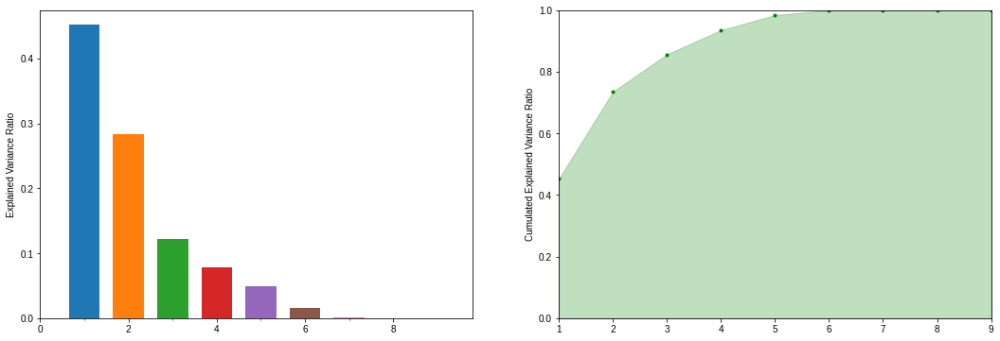

In [ ]:
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(18,6))
plt.style.use('seaborn-ticks')

x_tick = np.arange(len(PC_list))

for i in range(len(x_tick)):
    ax1.bar(x_tick[i]+1, exp_ratio[i], width = 0.7)
ax1.set_xticks(x_tick, PC_list)
ax1.set_ylabel('Explained Variance Ratio')

ax2.plot(x_tick+1, exp_ratio_cu, '.', color='g')
ax2.fill_between(x_tick+1, exp_ratio_cu, interpolate=True, color='g', alpha=0.25)
ax2.set_xticks(x_tick+1, PC_list)
ax2.set_ylabel('Cumulated Explained Variance Ratio')
ax2.set(xlim=(1, 9), ylim=(0.0, 1.0))

plt.show()
fig.savefig('variance_ratio.png', dpi=600)

### 2.2.2 Clustering

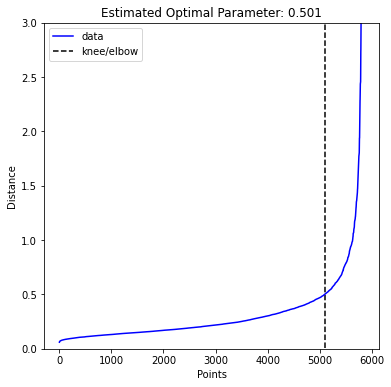

In [ ]:
elbow(data, n_neighbors=10, ylim=(0,3))

In [ ]:
db_label, db_label_name, db_outlier_label, db_core_sample, db_ori_labels = do_DBSCAN(data, eps=0.5, min_samples=10)

Estimated number of clusters: 7
Estimated number of noise points: 464


### 2.2.3 Plots

#### PCA

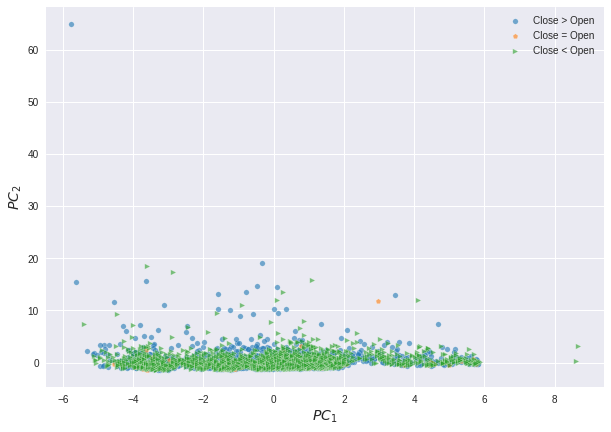

In [ ]:
fig, ax = biplot(pca_embedding, oc_label, oc_label_name, 'pca', size=(10,7))

#### Tuning SPCA

spca_embedding_0.5.pickle is saved!


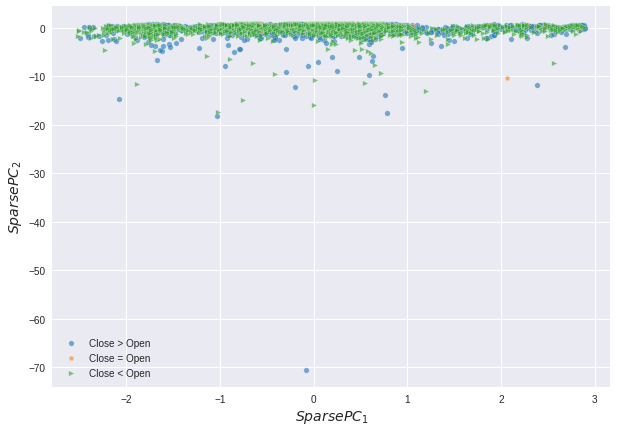

spca_embedding_0.65.pickle is saved!


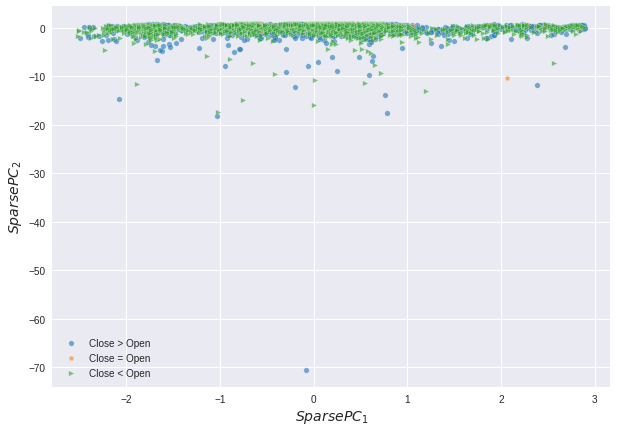

spca_embedding_0.8.pickle is saved!


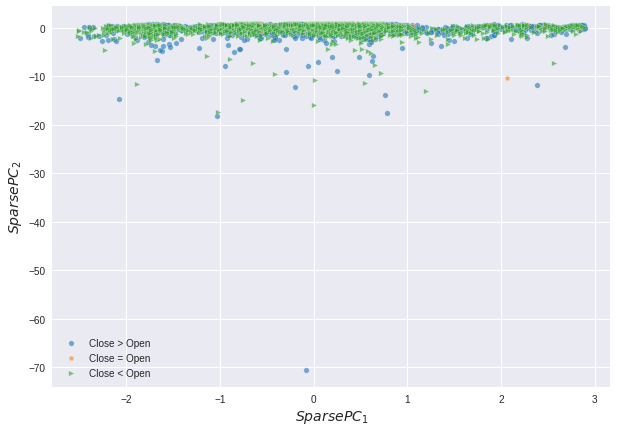

In [ ]:
# sparseness_t = [0.5, 0.65, 0.8]
# for sparseness in sparseness_t:
#     # spca_embedding = do_SPCA(data, sparseness=sparseness)
#     # save_pickle(spca_embedding, f'spca_embedding_{sparseness}')
#     file_name = f'spca_embedding_{sparseness}.pickle'
#     fp = open(file_name, 'rb')
#     spca_embedding = pickle.load(fp)
#     fp.close()
#     print(f'sparseness = {sparseness}')
#     fig, ax = biplot(spca_embedding, oc_label, oc_label_name, 'spca', size=(10,7))

In [ ]:
fig, ax = biplot(spca_embedding, oc_label, oc_label_name, 'spca', size=(10,7))

#### Tuning t-SNE

In [ ]:
# perplexity_t = [10, 20, 50, 100, 200]
# init_t = ['pca', 'random']
# for perplexity in perplexity_t:
#     for init in init_t:
#         # tsne_embedding = do_TSNE(data, perplexity=perplexity, init=init)
#         # save_pickle(tsne_embedding, f'tsne_embedding_{perplexity}_{init}')
#         file_name = f'tsne_embedding_{perplexity}_{init}.pickle'
#         fp = open(file_name, 'rb')
#         tsne_embedding = pickle.load(fp)
#         fp.close()
#         print(f'perplexity = {perplexity}, init = {init}')
#         fig, ax = biplot(tsne_embedding, oc_label, oc_label_name, 't-SNE', size=(10,7))

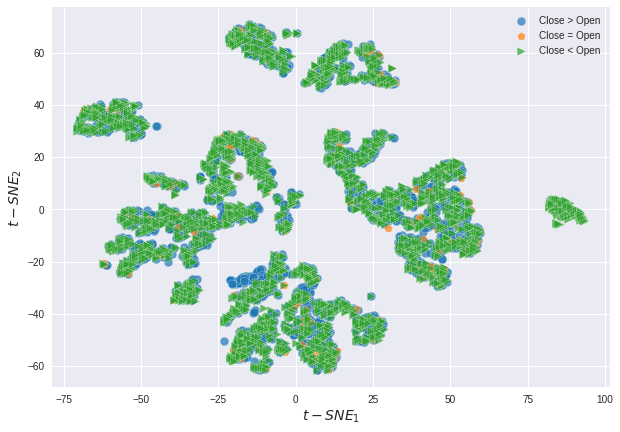

In [ ]:
fig, ax = biplot(tsne_embedding, oc_label, oc_label_name, 't-SNE', size=(10,7))

#### Tuning UMAP

umap_embedding_15_0.05.pickle is saved!


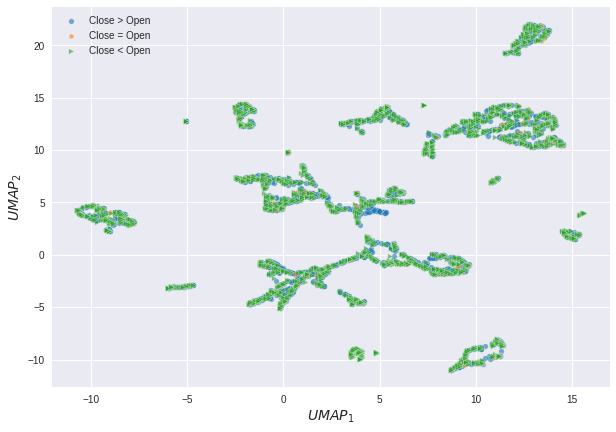

umap_embedding_15_0.1.pickle is saved!


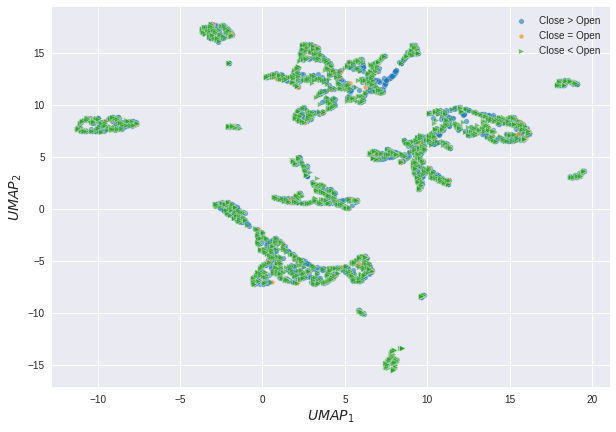

umap_embedding_15_0.2.pickle is saved!


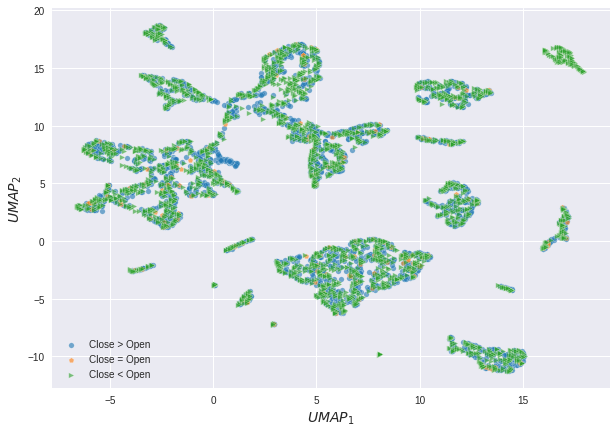

umap_embedding_50_0.05.pickle is saved!


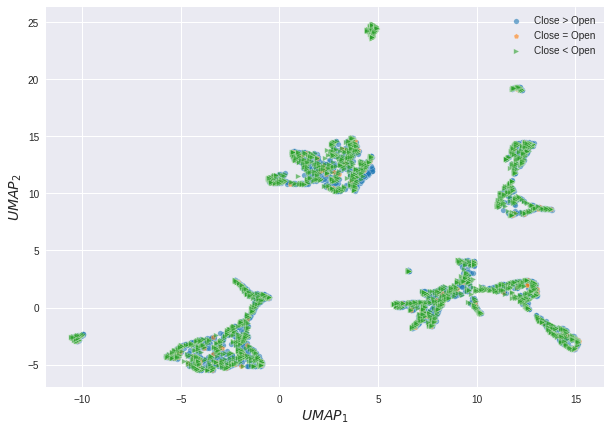

umap_embedding_50_0.1.pickle is saved!


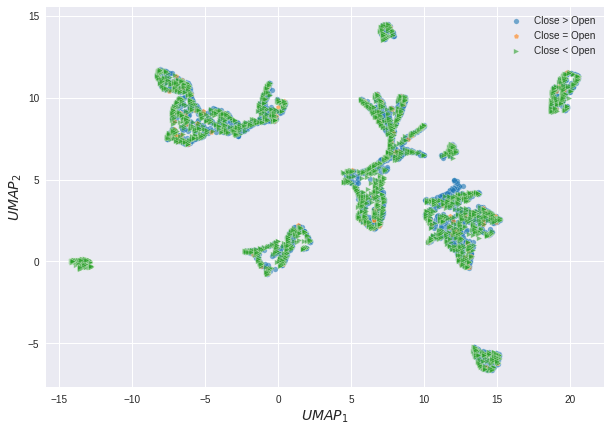

umap_embedding_50_0.2.pickle is saved!


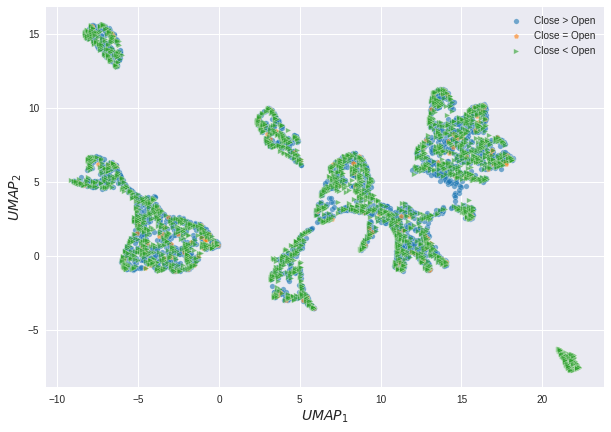

umap_embedding_150_0.05.pickle is saved!


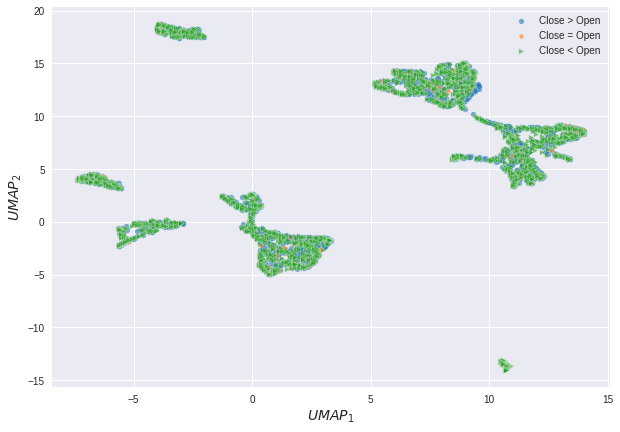

umap_embedding_150_0.1.pickle is saved!


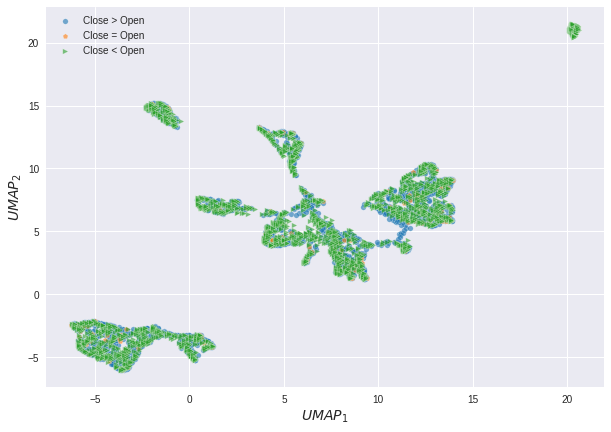

umap_embedding_150_0.2.pickle is saved!


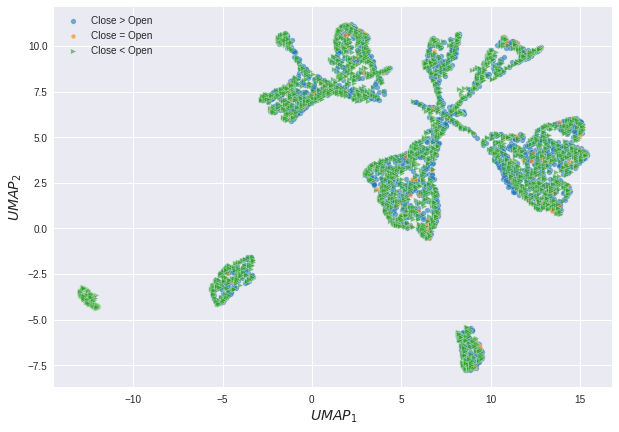

In [ ]:
# n_neighbors_t = [15, 50, 150]
# min_dist_t = [0.05, 0.1, 0.2]
# for n_neighbors in n_neighbors_t:
#     for min_dist in min_dist_t:
#         umap_embedding = do_UMAP(data, n_neighbors=n_neighbors, min_dist=min_dist, metric='euclidean', init='random')
#         save_pickle(umap_embedding, f'umap_embedding_{n_neighbors}_{min_dist}')
#         # file_name = f'umap_embedding_{n_neighbors}_{min_dist}.pickle'
#         # fp = open(file_name, 'rb')
#         # umap_embedding = pickle.load(fp)
#         # fp.close()
#         # print(f'n_neighbors = {n_neighbors}, min_dist = {min_dist}')
#         fig, ax = biplot(umap_embedding, oc_label, oc_label_name, 'UMAP', size=(10,7))

In [ ]:
fig, ax = biplot(umap_embedding, oc_label, oc_label_name, 'UMAP', size=(10,7))

NameError: ignored

#### DBSCAN - PCA

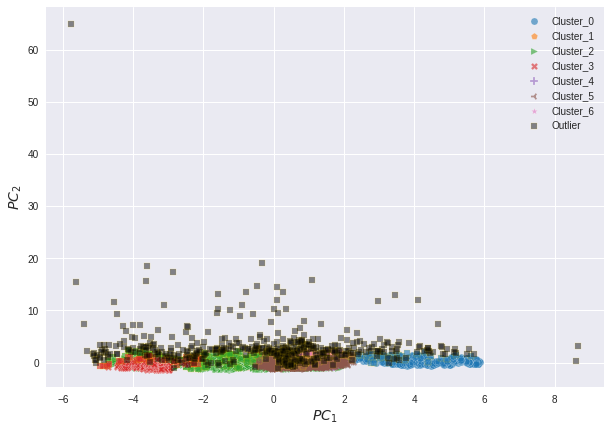

(<Figure size 720x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f131db65c18>)

In [ ]:
biplot_db(pca_embedding, db_label, db_label_name, db_core_sample, 'pca', (10,7), db_outlier_label)

#### DBSCAN - SPCA

sparseness = 0.5


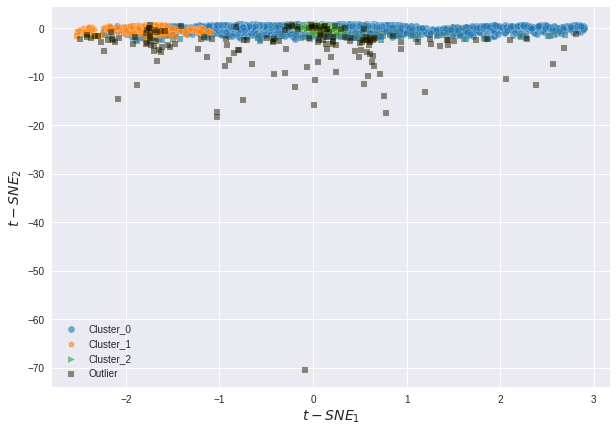

sparseness = 0.65


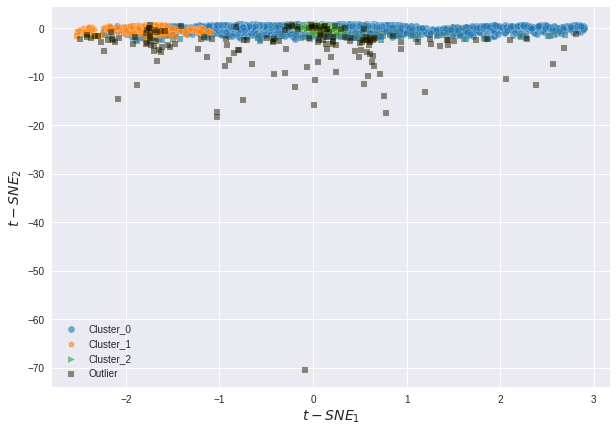

sparseness = 0.8


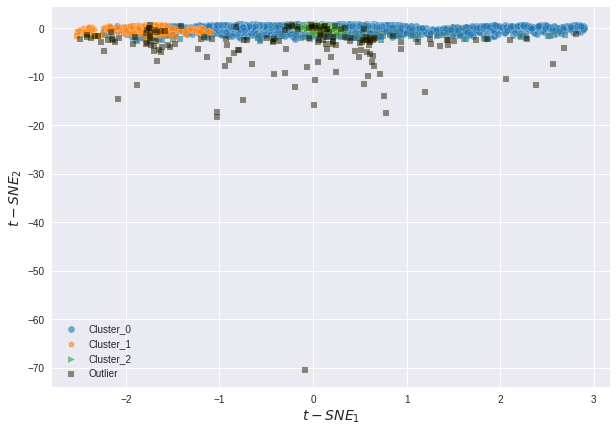

In [ ]:
# sparseness_t = [0.5, 0.65, 0.8]
# for sparseness in sparseness_t:
#     file_name = f'spca_embedding_{sparseness}.pickle'
#     fp = open(file_name, 'rb')
#     spca_embedding = pickle.load(fp)
#     fp.close()
#     print(f'sparseness = {sparseness}')
#     biplot_db(spca_embedding, db_label, db_label_name, db_core_sample, 't-SNE', (10,7), db_outlier_label)

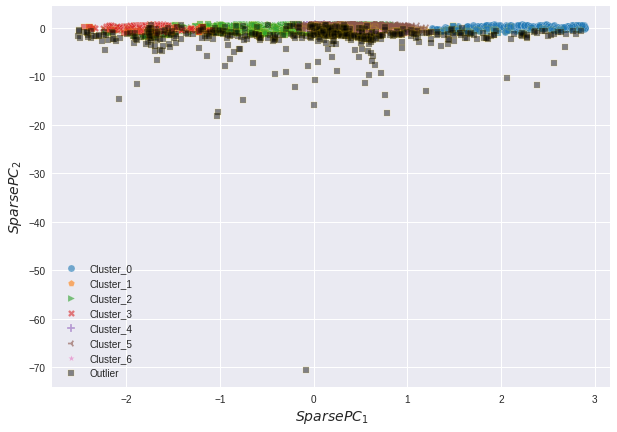

(<Figure size 720x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f1320340ac8>)

In [ ]:
biplot_db(spca_embedding, db_label, db_label_name, db_core_sample, 'spca', (10,7), db_outlier_label)

#### DBSCAN - t-SNE

In [ ]:
# perplexity_t = [10, 20, 50, 100, 200]
# init_t = ['pca', 'random']
# for perplexity in perplexity_t:
#     for init in init_t:
#         file_name = f'tsne_embedding_{perplexity}_{init}.pickle'
#         fp = open(file_name, 'rb')
#         tsne_embedding = pickle.load(fp)
#         fp.close()
#         print(f'perplexity = {perplexity}, init = {init}')
#         biplot_db(tsne_embedding, db_label, db_label_name, db_core_sample, 't-SNE', (10,7), db_outlier_label)

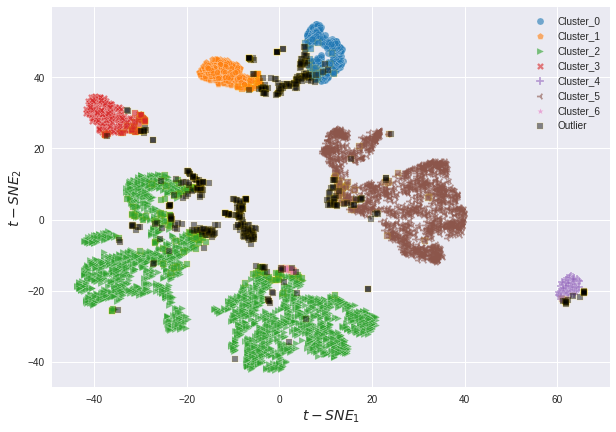

(<Figure size 720x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f131dd27d30>)

In [ ]:
biplot_db(tsne_embedding, db_label, db_label_name, db_core_sample, 't-SNE', (10,7), db_outlier_label)

#### DBSCAN - UMAP

In [ ]:
# n_neighbors_t = [15, 50, 150]
# min_dist_t = [0.05, 0.1, 0.2]
# for n_neighbors in n_neighbors_t:
#     for min_dist in min_dist_t:
#         # umap_embedding = do_UMAP(data, n_neighbors=n_neighbors, min_dist=min_dist, metric='euclidean', init='random')
#         # save_pickle(umap_embedding, f'umap_embedding_{n_neighbors}_{min_dist}')
#         file_name = f'umap_embedding_{n_neighbors}_{min_dist}.pickle'
#         fp = open(file_name, 'rb')
#         umap_embedding = pickle.load(fp)
#         fp.close()
#         print(f'n_neighbors = {n_neighbors}, min_dist = {min_dist}')
#         biplot_db(umap_embedding, db_label, db_label_name, db_core_sample, 'UMAP', (10,7), db_outlier_label)

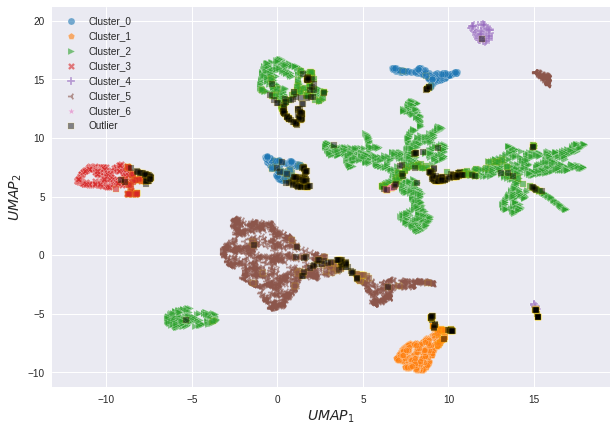

(<Figure size 720x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f131dcf9a90>)

In [ ]:
biplot_db(umap_embedding, db_label, db_label_name, db_core_sample, 'UMAP', (10,7), db_outlier_label)

## 2.3 Outliers and nSVA 

In [ ]:
ns_outlier_label = nsva_outlier(data, outlier_n=300)
data[ns_outlier_label]

,marketAverage,marketChangeOverTime,marketClose,marketHigh,marketLow,marketNotional,marketNumberOfTrades,marketOpen,marketVolume
786,174.129,0.007306,173.990,174.300,172.930,6.058726e+07,2356,174.030,347945
792,174.246,0.007983,174.447,174.480,173.790,5.828713e+07,2336,173.940,334510
793,174.363,0.008660,174.400,174.480,173.995,4.442417e+07,1372,174.430,254780
794,174.325,0.008440,174.339,174.430,174.230,2.757585e+07,1057,174.415,158186
795,174.298,0.008284,174.265,174.430,174.180,2.195587e+07,920,174.360,125967
...,...,...,...,...,...,...,...,...,...
1348,174.481,-0.001882,174.420,174.570,174.410,1.777959e+07,490,174.500,101900
1360,174.518,-0.001670,174.540,174.580,174.410,1.196410e+07,418,174.411,68555
1361,174.502,-0.001762,174.490,174.563,174.460,6.463910e+06,274,174.520,37042
1363,174.546,-0.001510,174.560,174.598,174.410,9.545554e+06,391,174.410,54688


In [ ]:
time_ = hft_aapl['Date']
time_ = pd.to_datetime(hft_aapl['Date'])

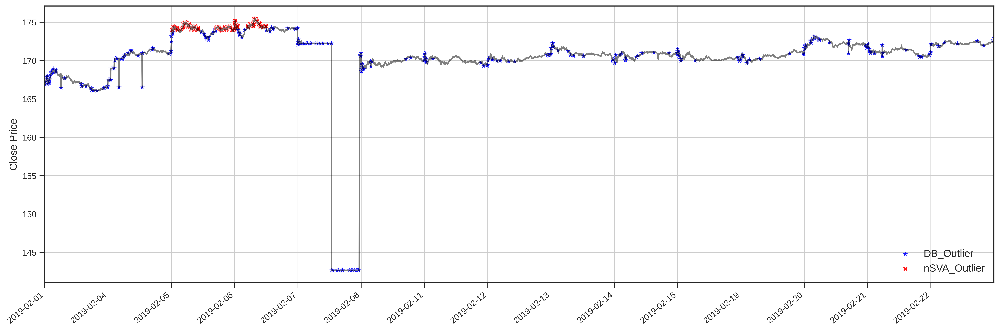

In [ ]:
fig, ax = plot_ol(time_, data['marketClose'], 'Close Price')
fig.savefig('Close.png', dpi=300)

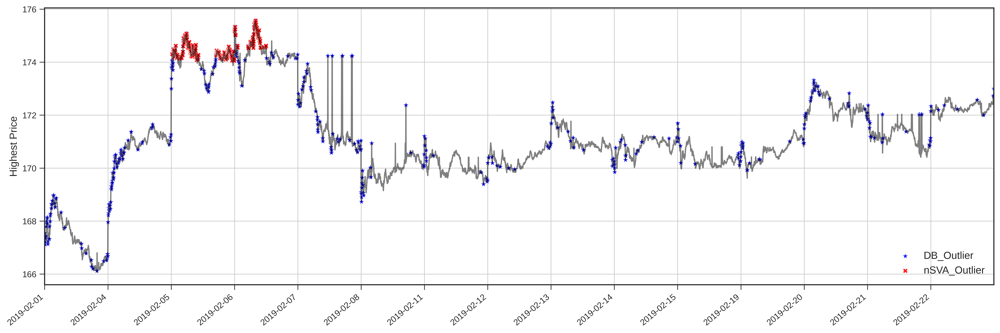

In [ ]:
fig, ax = plot_ol(time_, data['marketHigh'], 'Highest Price')
fig.savefig('High.png', dpi=300)

In [ ]:
data[['marketHigh','marketAverage']]

,marketHigh,marketAverage
0,167.55,167.058
1,167.42,167.182
2,167.20,167.051
3,167.11,166.945
4,167.19,167.045
...,...,...
5845,172.74,172.607
5846,172.70,172.631
5847,172.73,172.690
5848,172.74,172.677


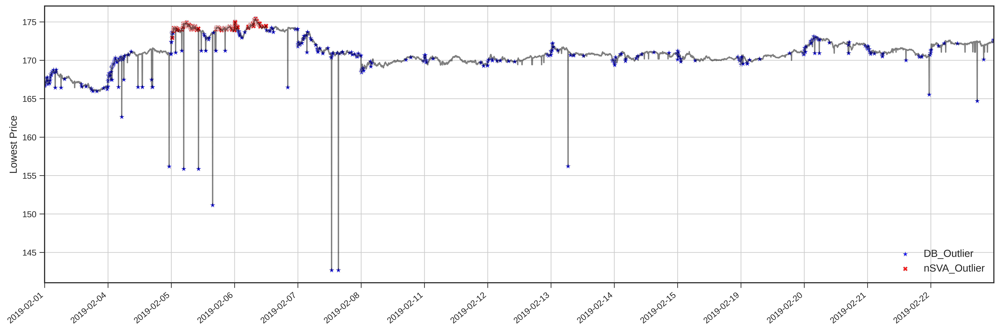

In [ ]:
fig, ax = plot_ol(time_, data['marketLow'], 'Lowest Price')
fig.savefig('Low.png', dpi=300)

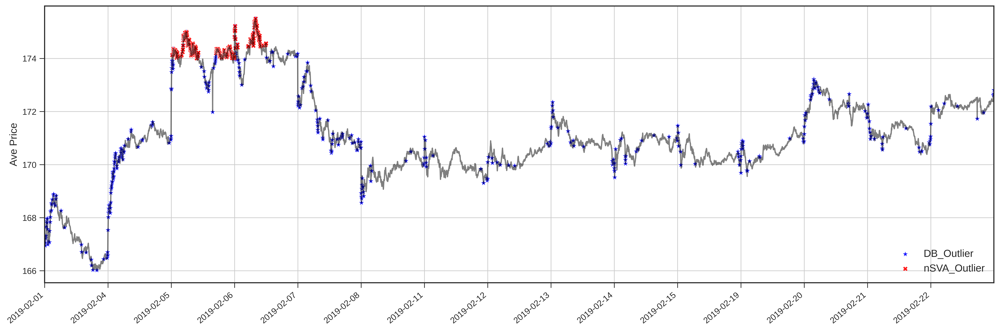

In [ ]:
fig, ax = plot_ol(time_, data['marketAverage'], 'Ave Price')
fig.savefig('Average.png', dpi=300)

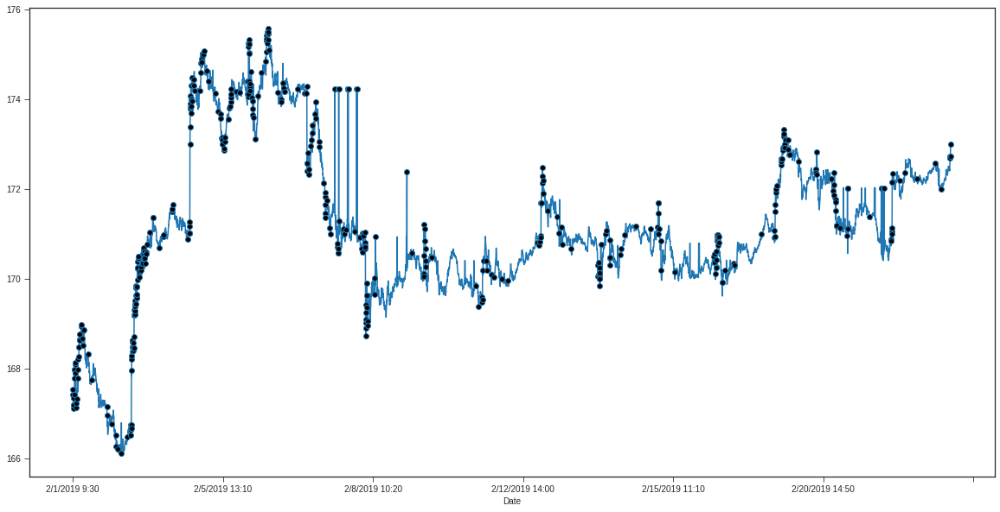

In [ ]:
# Plot by Chris

# #data=hft_aapl
# #import matplotlib.pyplot as plt
# # high price and low price embedding
# price_hl_embedding = data['marketHigh']
# x=pd.concat([price_hl_embedding,pd.get_dummies(db_outlier_label)[1]],axis=1)

# x.index=hft_aapl['Date']
# x['outlier']=x['marketHigh']*x.iloc[:,1]
# marks=x[1]

# dates=x[1]==1

# dates
# x1=x[dates]
# dates=x1.index
# x=x['marketHigh']


# def find_loc(df, dates):
#     marks = []
#     for date in dates:
#         marks.append(df.index.get_loc(date))
#     return marks

# plt.figure(figsize=(20,10))
# x.plot(linestyle='-',markevery=find_loc(x,dates), marker='o',markerfacecolor='black')
# #plt.show()
# #x['label'] = 1 if x[0]=='True' else 0

# plt.show()

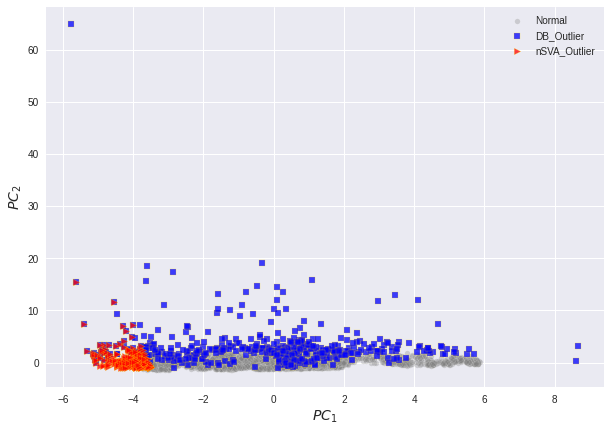

(<Figure size 720x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f131fc88c50>)

In [ ]:
# PCA
biplot_outliers(pca_embedding, db_outlier_label, ns_outlier_label, 'pca', (10,7))

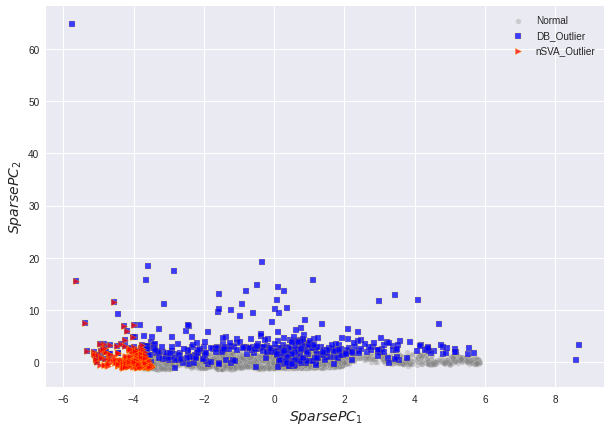

(<Figure size 720x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f1321eed8d0>)

In [ ]:
# SPCA
biplot_outliers(pca_embedding, db_outlier_label, ns_outlier_label, 'spca', (10,7))

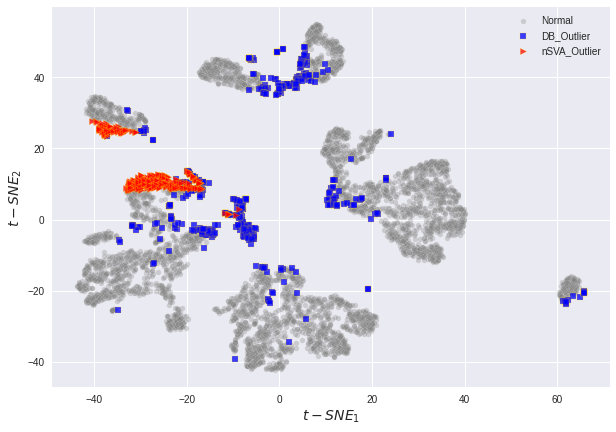

(<Figure size 720x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f131fbbfdd8>)

In [ ]:
# TSNE
biplot_outliers(tsne_embedding, db_outlier_label, ns_outlier_label, 't-SNE', (10,7))

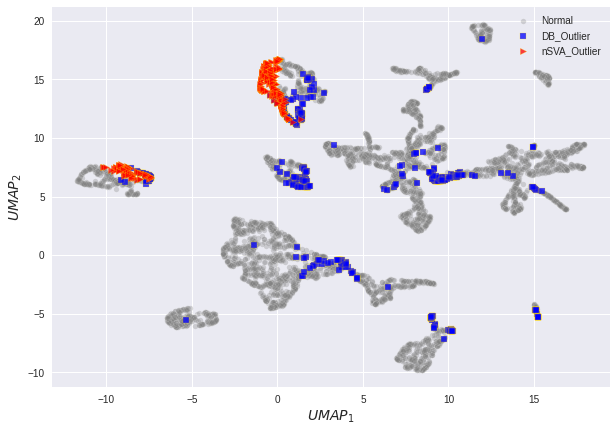

(<Figure size 720x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f131fcb2128>)

In [ ]:
# UMAP
biplot_outliers(umap_embedding, db_outlier_label, ns_outlier_label, 'UMAP', (10,7))

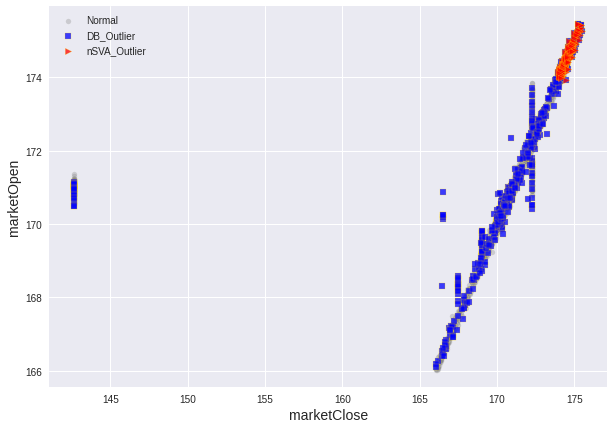

(<Figure size 720x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f13201ca2b0>)

In [ ]:
# open price and close price embedding
biplot_outliers(price_oc_embedding, db_outlier_label, ns_outlier_label, 'price', (10,7), ('marketClose', 'marketOpen'))

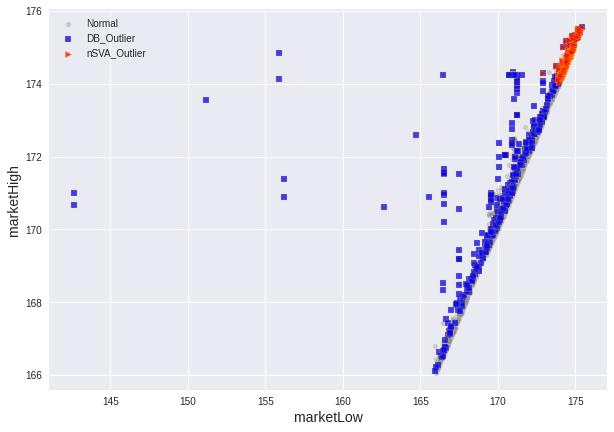

(<Figure size 720x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f131fae4d30>)

In [ ]:
# high price and low price embedding
biplot_outliers(price_hl_embedding, db_outlier_label, ns_outlier_label, 'price', (10,7), ('marketLow', 'marketHigh'))

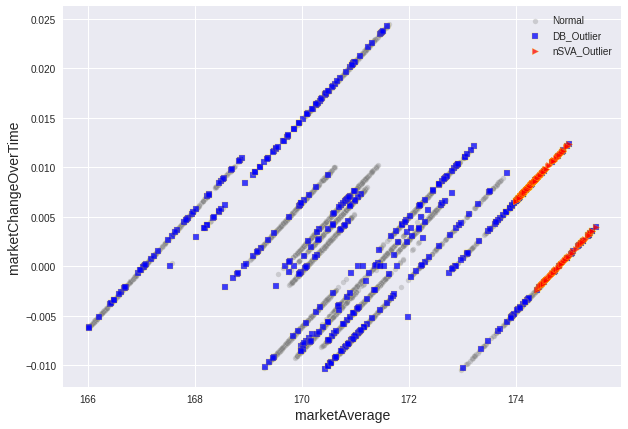

(<Figure size 720x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f131e2dbf98>)

In [ ]:
# average price and price change embedding
biplot_outliers(price_ac_embedding, db_outlier_label, ns_outlier_label, 'price', (10,7), ('marketAverage', 'marketChangeOverTime'))

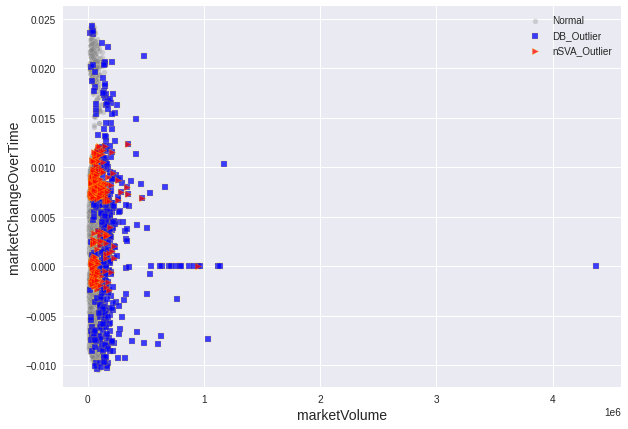

(<Figure size 720x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f131fac5e48>)

In [ ]:
# market volume and price change embedding
biplot_outliers(price_vc_embedding, db_outlier_label, ns_outlier_label, 'price', (10,7), ('marketVolume','marketChangeOverTime'))

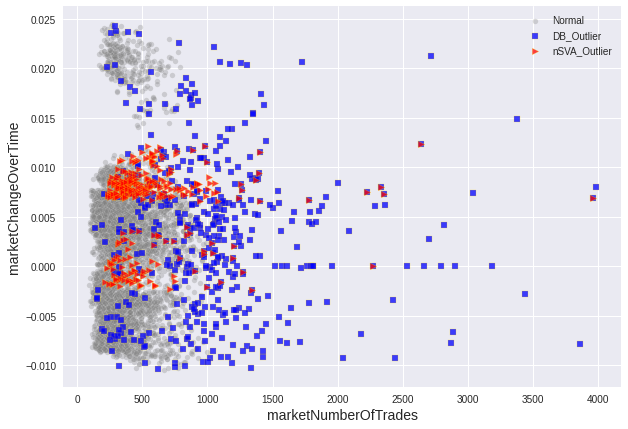

(<Figure size 720x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f1321e7b748>)

In [ ]:
# number of trades and price change embedding
biplot_outliers(price_tc_embedding, db_outlier_label, ns_outlier_label, 'price', (10,7), ('marketNumberOfTrades', 'marketChangeOverTime'))

## 2.5 More HFT data

### Downlaod the Data
Polygon.io API connection

In [ ]:
def my_customer_process_message(message):
    print("this is my custom message processing", message)


def main():
    key = 'W_ZswKZk4XrO1foPJhjd0xPeO8__r75IbtohNe'
    my_client = WebSocketClient(STOCKS_CLUSTER, key, my_customer_process_message)
    my_client.run_async()

    my_client.subscribe("AM.WMT", "AM.FB", "AM.GOOG", "AM.AMZN", "AM.HD", "AM.BAC", "AM.KSS")
    time.sleep(2)

    my_client.close_connection()


if __name__ == "__main__":
    main()

this is my custom message processing [{"ev":"status","status":"connected","message":"Connected Successfully"}]
this is my custom message processing [{"ev":"status","status":"auth_success","message":"authenticated"}]
this is my custom message processing [{"ev":"status","status":"success","message":"subscribed to: AM.WMT"}]
this is my custom message processing [{"ev":"status","status":"success","message":"subscribed to: AM.FB"}]
this is my custom message processing [{"ev":"status","status":"success","message":"subscribed to: AM.GOOG"}]
this is my custom message processing [{"ev":"status","status":"success","message":"subscribed to: AM.AMZN"}]
this is my custom message processing [{"ev":"status","status":"success","message":"subscribed to: AM.HD"}]
this is my custom message processing [{"ev":"status","status":"success","message":"subscribed to: AM.BAC"}]
this is my custom message processing [{"ev":"status","status":"success","message":"subscribed to: AM.KSS"}]


In [ ]:
HFT=['WMT','FB','GOOG','AMZN','HD','BAC','KSS']
q=dict()
for i in HFT:
    def main():
        key = "W_ZswKZk4XrO1foPJhjd0xPeO8__r75IbtohNe"
        client = RESTClient(key)

        resp = client.stocks_equities_aggregates(i,1,'minute', "2020-06-12","2020-06-15")
        return(resp.results)
       

    if __name__ == '__main__':
        q[i]=main()

In [ ]:
os.chdir('/content/drive/Shared drives/ACF Project/data/HFT Json')

In [ ]:
#q['WMT']
for i in HFT:
    out_file = open(i+".json", "w")
    json.dump(q[i], out_file, indent = 6)
    out_file.close() 

### Load Data and Analysis

In [ ]:
read_path_2 = '/content/drive/Shared drives/ACF Project/data/HFT Json'
os.chdir(read_path_2)
!ls

AMZN.json  BAC.json  FB.json  GOOG.json  HD.json  KSS.json  WMT.json


In [ ]:
ticker_list = ['AMZN', 'BAC', 'FB', 'GOOG', 'HD', 'KSS', 'WMT']
hft_dict = {}
for i in ticker_list:
    file_name = i+'.json'
    hft_dict[i] = pd.read_json(file_name)

In [ ]:
hft_dict['AMZN'].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1011 entries, 0 to 1010
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   v       1011 non-null   int64  
 1   vw      1011 non-null   float64
 2   o       1011 non-null   float64
 3   c       1011 non-null   float64
 4   h       1011 non-null   float64
 5   l       1011 non-null   float64
 6   t       1011 non-null   int64  
 7   n       521 non-null    float64
dtypes: float64(6), int64(2)
memory usage: 63.3 KB


In [ ]:
hft_dict['AMZN']
col_rename = {'v':'Volume', 'vw':'Volume Weighted Average Price', 'o':'Open', 'c':'Close', 'h':'High', 'l':'Low', 't':'Timestamp', 'n':'NumberOfItems'}

,v,vw,o,c,h,l,t,n
0,164,2589.9549,2590.00,2590.00,2590.00,2590.00,1591948800000,4.0
1,160,2587.1813,2587.25,2587.25,2587.25,2587.25,1591949700000,4.0
2,259,2589.9626,2589.94,2589.94,2589.94,2589.94,1591951500000,9.0
3,489,2591.7314,2591.43,2592.00,2592.00,2591.43,1591951740000,6.0
4,314,2592.9820,2592.91,2592.91,2592.91,2592.91,1591952100000,5.0
...,...,...,...,...,...,...,...,...
1006,102,2576.7831,2576.75,2576.75,2576.75,2576.75,1592260980000,NaN
1007,279,2578.7809,2578.59,2578.85,2578.85,2578.59,1592261640000,NaN
1008,201,2577.9686,2577.99,2577.99,2577.99,2577.99,1592262600000,NaN
1009,420,2576.5107,2576.50,2576.50,2576.50,2576.50,1592262720000,NaN


# Question 3

###import files

In [ ]:
##import all the files

path = r'/content/drive/Shared drives/ACF Project/data/Question 3 data' # use your path
all_files = glob.glob(path + "/*.csv")

li = []

for filename in all_files:
    df = pd.read_csv(filename, index_col=None, header=0,na_filter=False)
    li.append(df)

In [ ]:
names = [os.path.basename(x) for x in glob.glob(path + "/*.csv")]
list_names = [i.split(".")[0] for i in names]
print(list_names)

data_names = dict()

for j in range(len(li)):
    data_names[list_names[j]]=pd.DataFrame(li[j])

data_names

['GOOG2019-03-01-05-16', 'credit_risk_clean_data']


{'GOOG2019-03-01-05-16':         average          changeOverTime  ...      open volume
 0      1164.841                     0.0  ...   1165.76    420
 1       1165.33   0.0004197997838331865  ...   1165.33    100
 2      1165.625    0.000673053232157956  ...  1165.625    400
 3      1163.274  -0.0013452479780502295  ...   1164.65    202
 4       1165.18   0.0002910268440071814  ...   1164.95    400
 ...         ...                     ...  ...       ...    ...
 17545  1140.604    0.011920139677492753  ...   1139.41    843
 17546  1140.488     0.01181722689075645  ...   1140.85    959
 17547   1141.01    0.012280334431069814  ...    1140.4    472
 17548  1141.254    0.012496806154894402  ...   1141.08   1158
 17549  1141.217    0.012463980524642473  ...   1141.33   1369
 
 [17550 rows x 21 columns],
 'credit_risk_clean_data':         Delinquency  Revolving Credit Percentage  ...  Num Late 90  Num Employees
 0                 1                     0.766127  ...            0            2.

In [ ]:

data_names1 = data_names.copy()
for i in data_names1:
  data_names1[i]=data_names1[i].select_dtypes(include=['number'])

data_names1



{'GOOG2019-03-01-05-16':        marketNotional  marketNumberOfTrades  marketVolume     notional  numberOfTrades  volume
 0        3.091377e+07                    68         26547   489233.200               5     420
 1        3.727642e+06                    27          3200   116533.000               1     100
 2        4.019620e+06                    32          3450   466250.000               2     400
 3        2.809869e+06                    18          2414   234981.300               2     202
 4        6.005359e+06                    29          5153   466072.000               2     400
 ...               ...                   ...           ...          ...             ...     ...
 17545    1.769920e+07                   516         15519   961529.100              12     843
 17546    1.124871e+07                   296          9862  1093727.765              15     959
 17547    9.663693e+06                   316          8471   538556.660              10     472
 17548    1.9624

###Google HLLE MLLE

In [ ]:
n_neighbors=5

In [ ]:
clf = LocallyLinearEmbedding(n_neighbors=n_neighbors, n_components=2,
                                      method='standard')
t0 = time()
X_lle = clf.fit_transform(data_names1['GOOG2019-03-01-05-16'])
print("Done. Reconstruction error: %g" % clf.reconstruction_error_)

In [ ]:
clf = LocallyLinearEmbedding(n_neighbors=n_neighbors, n_components=2,
                                      method='modified',eigen_solver ="dense" )
t0 = time()
X_mlle = clf.fit_transform(data_names1['GOOG2019-03-01-05-16'])
print("Done. Reconstruction error: %g" % clf.reconstruction_error_)

In [ ]:
import pickle

filename='xmlle_google_new_data.pickle'

fp=open(filename,'wb')

pickle.dump(X_mlle,fp)

fp.close()

print('\n'+filename+'is saved!\n')


xmlle_google_new_data.pickleis saved!



In [ ]:
n_neighbors=20

In [ ]:
clf = LocallyLinearEmbedding(n_neighbors=n_neighbors, n_components=2,
                                      method='hessian',eigen_solver ="dense")
#t0 = time()
X_hlle = clf.fit_transform(data_names1['GOOG2019-03-01-05-16'])
print("Done. Reconstruction error: %g" % clf.reconstruction_error_)

In [ ]:
os.chdir('drive/Shared drives/ACF Project/data/Question 3 data')

In [ ]:
import pickle

filename='xhlle_google_new_data.pickle'

fp=open(filename,'wb')

pickle.dump(X_hlle,fp)

fp.close()

print('\n'+filename+'is saved!\n')


xhlle_google_new_data.pickleis saved!



###HLLE MLLE for Credit Risk Data breaks

In [ ]:
df_split=data_names1['credit_risk_clean_data']

n = 20100  #chunk row size
list_df = [df_split[i:i+n] for i in range(0,df_split.shape[0],n)]

list_df[5]


,Delinquency,Revolving Credit Percentage,Capital Reserves,Num Late 60,Debt Ratio,Monthly Income,Num Credit Lines,Num Late Past 90,Num Real Estate,Num Late 90,Num Employees
100500,0,0.043028,64,0,0.181930,6518.0,7,0,1,0,0.0
100501,0,0.249313,54,2,0.306208,7409.0,6,0,1,1,0.0
100502,0,0.017310,70,0,0.088763,3897.0,10,0,0,0,0.0
100503,0,0.047001,39,0,0.562479,3000.0,9,0,1,0,0.0
100504,0,0.180455,58,0,0.351324,8800.0,23,0,1,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
120264,0,0.385742,50,0,0.404293,3400.0,7,0,0,0,0.0
120265,0,0.040674,74,0,0.225131,2100.0,4,0,1,0,0.0
120266,0,0.299745,44,0,0.716562,5584.0,4,0,1,0,2.0
120267,0,0.000000,30,0,0.000000,5716.0,4,0,0,0,0.0


In [ ]:

for i in range(len(list_df)):

  n_neighbors=5
  clf = LocallyLinearEmbedding(n_neighbors=n_neighbors, n_components=2,
                                      method='modified',eigen_solver ="dense" )
  X_mlle = clf.fit_transform(list_df[i])
  print("Done. Reconstruction error: %g" % clf.reconstruction_error_)
  n_neighbors=20
  filename=str(i)+'xmlle_credit_new_data.pickle'

  fp=open(filename,'wb')

  pickle.dump(X_mlle,fp)

  fp.close()

  print('\n'+filename+'is saved!\n')

  clf = LocallyLinearEmbedding(n_neighbors=n_neighbors, n_components=2,
                                      method='hessian',eigen_solver ="dense")
  #t0 = time()
  X_hlle = clf.fit_transform(list_df[i])
  print("Done. Reconstruction error: %g" % clf.reconstruction_error_)

  filename=str(i)+'xhlle_credit_new_data.pickle'

  fp=open(filename,'wb')

  pickle.dump(X_hlle,fp)

  fp.close()

  print('\n'+filename+'is saved!\n')


###import mlle tlle

In [ ]:

  

path = r'/content/drive/Shared drives/ACF Project/data/Question 3 data' # use your path
all_files = glob.glob(path + "/*.pickle")

li = []

for filename in all_files:
    
  filename=filename
  infile = open(filename,'rb')
  new_dict = pickle.load(infile)
  infile.close()
  li.append(new_dict)




In [ ]:
names = [os.path.basename(x) for x in glob.glob(path + "/*.pickle")]
list_names = [i.split(".")[0] for i in names]
print(list_names)

data_names = dict()

for j in range(len(li)):
    data_names[list_names[j]]=li[j]

data_names

In [ ]:
mlle_im=list(['0xmlle_credit_new_data','1xmlle_credit_new_data','2xmlle_credit_new_data','3xmlle_credit_new_data','4xmlle_credit_new_data','5xmlle_credit_new_data'])


hlle_im=list(['0xhlle_credit_new_data','1xhlle_credit_new_data','2xhlle_credit_new_data','3xhlle_credit_new_data','4xhlle_credit_new_data','5xhlle_credit_new_data'])


In [ ]:
hlle_df=pd.DataFrame()
for i in range(len(hlle_im)):
  hlle_df=hlle_df.append(pd.DataFrame(data_names[hlle_im[i]]),ignore_index=True)

hlle_df=hlle_df.to_numpy()

mlle_df=pd.DataFrame()
for i in range(len(mlle_im)):
  mlle_df=mlle_df.append(pd.DataFrame(data_names[mlle_im[i]]),ignore_index=True)

mlle_df=mlle_df.to_numpy()

###Credit risk pca spca tsne umap hlle mlle

In [ ]:
data_names1['credit_risk_clean_data']['Del']= data_names1['credit_risk_clean_data']['Delinquency'].apply(lambda x: 'Delinquent' if x>0 else'Non-Delinquent' )

#hft_aapl['Change'] = hft_aapl['marketClose'] - hft_aapl['marketOpen']
#hft_aapl['Change'] = hft_aapl['Change'].apply(lambda x: 'Rise' if x>0 else ('Fall' if x<0 else 'Flat'))
#change_ = hft_aapl['Change']
oc_label = [data_names1['credit_risk_clean_data']['Del']== 'Delinquent', data_names1['credit_risk_clean_data']['Del']== 'Non-Delinquent']
oc_label_name = ['Delinquent', 'Non-Delinquent']



In [ ]:
os.chdir('/content/drive/Shared drives/ACF Project/data/Question 3 data')
# # Load pickle file
file_names_p = ['pca_embedding', 'spca_embedding', 'tsne_embedding', 'umap_embedding']
embeddings = {}
for i in range(len(file_names_p)):
    file_name = file_names_p[i] + '.pickle'
    fp = open(file_name, 'rb')
    embeddings[file_names_p[i]] = pickle.load(fp)
    fp.close()
pca_embedding, spca_embedding, tsne_embedding, umap_embedding = embeddings.values()

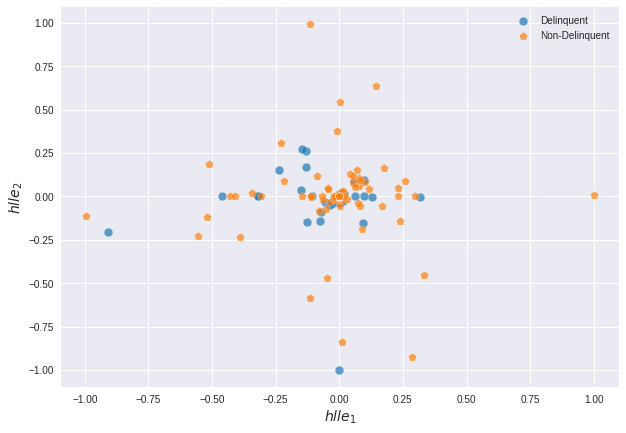

In [ ]:
fig, ax = biplot(hlle_df, oc_label, oc_label_name, 'hlle', size=(10,7))

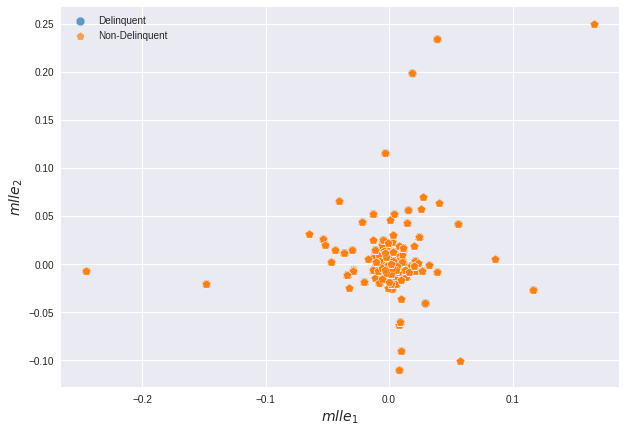

In [ ]:
fig, ax = biplot(mlle_df, oc_label, oc_label_name, 'mlle', size=(10,7))

In [ ]:
pca_embedding = do_PCA(data_names1['credit_risk_clean_data'])
save_pickle(pca_embedding, 'pca_embedding')

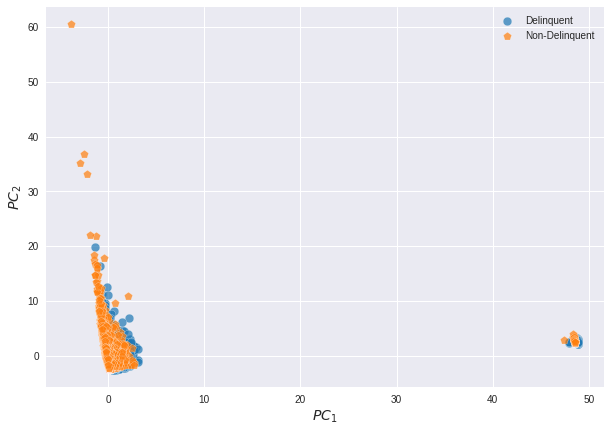

In [ ]:
fig, ax = biplot(pca_embedding, oc_label, oc_label_name, 'pca', size=(10,7))

In [ ]:
spca_embedding = do_SPCA(data_names1['credit_risk_clean_data'], sparseness=0.8)
save_pickle(spca_embedding, 'spca_embedding')

spca_embedding.pickle is saved!


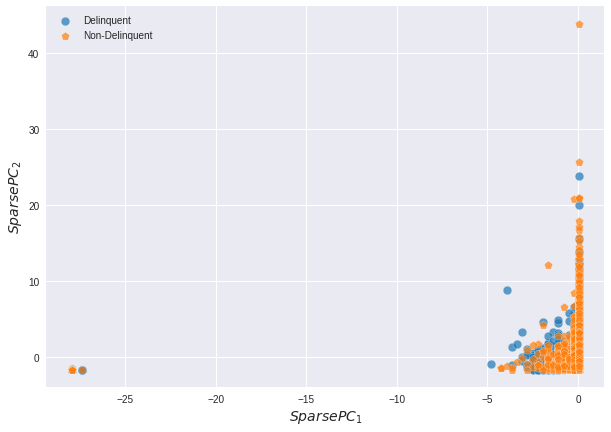

In [ ]:
fig, ax = biplot(spca_embedding, oc_label, oc_label_name, 'spca', size=(10,7))

In [ ]:
tsne_embedding = do_TSNE(data_names1['credit_risk_clean_data'], perplexity=50, init='pca')
save_pickle(tsne_embedding, 'tsne_embedding')

tsne_embedding.pickle is saved!


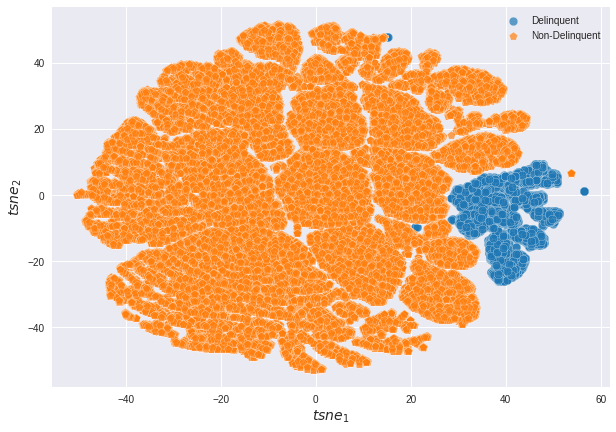

array([[ 36.049667  ,   4.856854  ],
       [ 10.725496  , -25.927769  ],
       [ -0.24834193, -40.408756  ],
       ...,
       [ 20.850824  ,  -6.324272  ],
       [ -3.9912593 , -47.230167  ],
       [-26.884314  ,  25.09398   ]], dtype=float32)

In [ ]:
fig, ax = biplot(tsne_embedding, oc_label, oc_label_name, 'tsne', size=(10,7))

In [ ]:
umap_embedding = do_UMAP(data_names1['credit_risk_clean_data'], n_neighbors=50, min_dist=0.05, metric='euclidean', init='random')
save_pickle(umap_embedding, 'umap_embedding')

umap_embedding.pickle is saved!


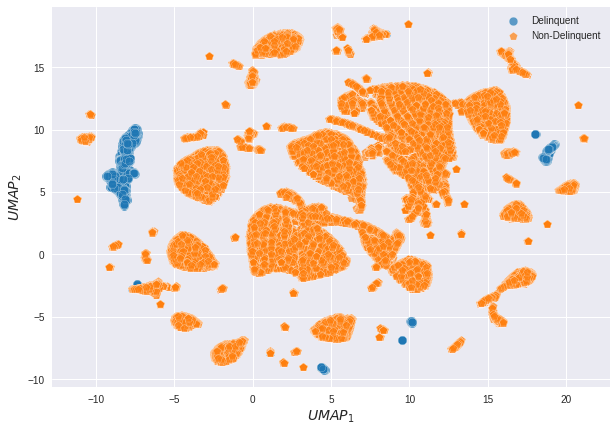

In [ ]:
fig, ax = biplot(umap_embedding, oc_label, oc_label_name, 'UMAP', size=(10,7))

## Neighbors

#### Neighbor Functions

In [ ]:
def random_sample(data, size):
    if size > len(data):
        print(f'The required sample size is too large, the data only has {len(data)} records!')
        quit
    else:
        idx = np.random.choice(len(data),size,replace=False)
        idx.sort()
        return idx

In [ ]:
def get_neighbors(data, n_neighbors=10, normalize=True):
    if normalize:
        data_ = StandardScaler().fit_transform(data)
    else:
        data_ = data
    nbrs = NearestNeighbors(n_neighbors=(10+1))
    neighbors = nbrs.fit(data_)
    distances, indices = neighbors.kneighbors(data_)
    nb = indices[:,1:]
    return nb

In [ ]:
def overlap_rate(n1, n2, idx=None):
    if len(n1) != len(n2):
        print('Two data should have same length!')
        quit
    else:
        rates = []
        if idx is None:
            idx = range(len(n1))
        for i in idx:
            rate = len(set(n1[i])&set(n2[i]))/len(set(n1[i]))
            rates.append(rate)
        ave_rate = np.mean(rates)
        return ave_rate

In [ ]:
def n_neighbor_df(ori_data, n_neighbors=10, size=200):
    sample_idx = random_sample(ori_data, size)
    neighbors = get_neighbors(ori_data, n_neighbors=n_neighbors, normalize=True)[sample_idx]
    cols = [f'Neighbor_{i+1}' for i in range(n_neighbors)]
    neighbors_df = pd.DataFrame(data=neighbors, index=sample_idx, columns=cols)
    return sample_idx, neighbors, neighbors_df

In [ ]:
def compare(n1, data2, idx, embedding_name):
    n2 = get_neighbors(data2, n_neighbors=10, normalize=False)[idx]
    o_rate = overlap_rate(n1, n2)
    print(f'The 10-nearest neighbor overlap rate for original space and {embedding_name} space is {o_rate:.3f}.')

### do

In [ ]:
temp_data = data_names1['credit_risk_clean_data']
sample_idx, neighbors, neighbors_df = n_neighbor_df(temp_data, n_neighbors=10, size=200)
compare(neighbors, pca_embedding[:,0:2], sample_idx, 'PCA')
compare(neighbors, pca_embedding[:,0:2], sample_idx, 'SPCA')
compare(neighbors, tsne_embedding[:,0:2], sample_idx, 'TSNE')
compare(neighbors, umap_embedding[:,0:2], sample_idx, 'UMAP')
neighbors_df

The 10-nearest neighbor overlap rate for original space and PCA space is 0.074.
The 10-nearest neighbor overlap rate for original space and SPCA space is 0.074.
The 10-nearest neighbor overlap rate for original space and TSNE space is 0.504.
The 10-nearest neighbor overlap rate for original space and UMAP space is 0.377.


,Neighbor_1,Neighbor_2,Neighbor_3,Neighbor_4,Neighbor_5,Neighbor_6,Neighbor_7,Neighbor_8,Neighbor_9,Neighbor_10
1404,86079,1969,56237,56282,38143,85812,105742,27347,39730,73192
1883,37734,97678,12352,27600,93106,10751,104749,97345,89880,119098
2111,12661,35786,8471,25822,40101,45231,6384,33429,20028,4572
2374,90472,106864,119447,18655,109982,60248,13523,40199,43152,3069
2388,67201,84077,66154,20421,57700,57711,23076,111149,30803,33127
...,...,...,...,...,...,...,...,...,...,...
117697,72871,85776,114983,94045,44735,113132,101430,70862,118836,118814
117975,33707,50652,690,111186,45752,54949,82209,85661,33059,119809
118643,28924,93048,83754,6617,88959,87849,16818,16946,79246,22414
118885,24345,22188,29544,54437,111451,102611,116751,47802,88456,14937


In [ ]:
# for i in data_names1.values():
#     temp_data = i
#     pca_newdata = do_PCA(temp_data)[:,0:2]
#     spca_newdata = do_SPCA(temp_data, sparseness=0.8)[:,0:2]
#     sample_idx, neighbors, neighbors_df = n_neighbor_df(temp_data, n_neighbors=10, size=200)
#     file_name = '10_neighbors'+''+'.xlsx'
#     neighbors_df.to_excel(file_name)
#     compare(neighbors, pca_newdata, sample_idx, 'PCA')
#     compare(neighbors, spca_newdata, sample_idx, 'SPCA')
#     # compare(neighbors, tsne_embedding[:,0:2], sample_idx, 'TSNE')
#     # compare(neighbors, umap_embedding[:,0:2], sample_idx, 'UMAP')
#     pca_embedding, spca_embedding, tsne_embedding, umap_embedding 

The 10-nearest neighbor overlap rate for original space and PCA space is 0.502.
The 10-nearest neighbor overlap rate for original space and SPCA space is 0.009.
The 10-nearest neighbor overlap rate for original space and PCA space is 0.085.
The 10-nearest neighbor overlap rate for original space and SPCA space is 0.014.
